# U.S. Airbnb Data Cleaning


Airbnb, Inc is an American company that operates an online marketplace for lodging, primarily homestays for vacation rentals, and tourism activities. Based in San Francisco, California, the platform is accessible via website and mobile app. Airbnb does not own any of the listed properties; instead, it profits by receiving commission from each booking. The company was founded in 2008. Airbnb is a shortened version of its original name, AirBedandBreakfast.com.


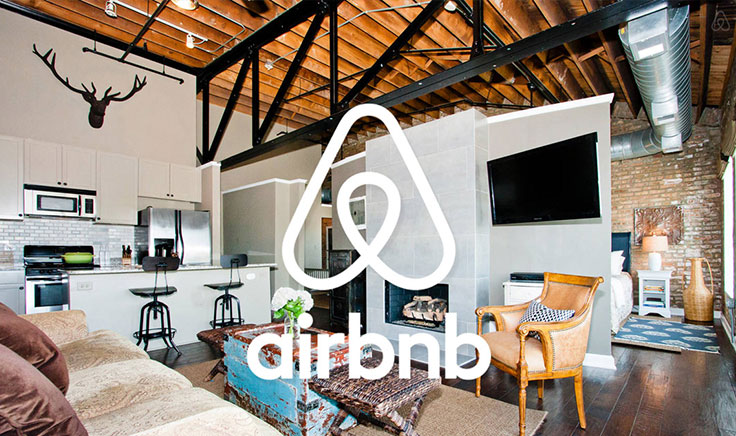

## About Dataset

### New York City Airbnb Open Data


#### Context
Since 2008, guests and hosts have used Airbnb to expand on traveling possibilities and present more unique, personalized way of experiencing the world. This dataset describes the listing activity and metrics in NYC, NY for 2022.!



#### Content
This data file includes all needed information to find out more about hosts, geographical availability, necessary metrics
The following Airbnb activity is included in this New York dataset:
Listings, including full descriptions and average review score
Reviews, including unique id for each reviewer and detailed comments
Calendar, including listing id and the price and availability for that day

#### Acknowledgements
This dataset is part of Airbnb Inside but I tried to make new columns and many data inconsistency issue to create a new dataset to practice data cleaning.
The original source can be found [here](http://insideairbnb.com/explore).

#### Inspiration
* Learn Data Cleaning
* Data Cleaning Challenge
* Data Cleaning Practice for beginners
* Handling missing values
* Handling Outliers
* Handle inconsistent data
* Data Visualization
* Data analysis
* What can we learn about different hosts and areas?
* What can we learn from predictions? (ex: locations, prices, reviews, etc)
* Which hosts are the busiest and why?


### Loading modules
First we load some basic modules to make our life easier.

In [1]:
import os
import numpy as np
import json
import pprint
import urllib.request
import seaborn as sns
import statsmodels.api as sm
import pandas as pd
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_columns', 200)
import datetime as dt
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10, 8) 
plt.style.use('fivethirtyeight')
from statsmodels.graphics.gofplots import qqline
import statistics
import warnings
warnings.filterwarnings('ignore')
from plotly import graph_objects as go
from plotly import express as px
import folium
import folium.plugins
import scipy.stats as scistat
from collections import Counter
from statsmodels.api import add_constant
from pyod.utils.data import generate_data
from pyod.models.knn import KNN
from sklearn.preprocessing import StandardScaler
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Loading data

In [2]:
AirbnbData = pd.read_csv("./New-York-City-Airbnb-Open-Data" , low_memory=False)

In [3]:
AirbnbData.shape

(102599, 26)

In [4]:
AirbnbData.dtypes

id                                  int64
NAME                               object
host id                             int64
host_identity_verified             object
host name                          object
neighbourhood group                object
neighbourhood                      object
lat                               float64
long                              float64
country                            object
country code                       object
instant_bookable                   object
cancellation_policy                object
room type                          object
Construction year                 float64
price                              object
service fee                        object
minimum nights                    float64
number of reviews                 float64
last review                        object
reviews per month                 float64
review rate number                float64
calculated host listings count    float64
availability 365                  

In [5]:
AirbnbData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [6]:
AirbnbData.head()

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,United States,US,False,strict,Private room,"2,020.00",$966,$193,10.00,9.00,10/19/2021,0.21,4.00,6.00,286.00,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75,-73.98,United States,US,False,moderate,Entire home/apt,"2,007.00",$142,$28,30.00,45.00,5/21/2022,0.38,4.00,2.00,228.00,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.81,-73.94,United States,US,True,flexible,Private room,"2,005.00",$620,$124,3.00,0.00,NaN,NaN,5.00,1.00,352.00,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.69,-73.96,United States,US,True,moderate,Entire home/apt,"2,005.00",$368,$74,30.00,270.00,7/5/2019,4.64,4.00,1.00,322.00,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.80,-73.94,United States,US,False,moderate,Entire home/apt,"2,009.00",$204,$41,10.00,9.00,11/19/2018,0.10,3.00,1.00,289.00,"Please no smoking in the house, porch or on th...",NaN


In [7]:
AirbnbData.head(1)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,United States,US,False,strict,Private room,"2,020.00",$966,$193,10.00,9.00,10/19/2021,0.21,4.00,6.00,286.00,Clean up and treat the home the way you'd like...,NaN


In [8]:
AirbnbData.tail()

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
102594,6092437,Spare room in Williamsburg,12312296767,verified,Krik,Brooklyn,Williamsburg,40.71,-73.95,United States,US,False,flexible,Private room,"2,003.00",$844,$169,1.00,0.00,NaN,NaN,3.00,1.00,227.00,No Smoking No Parties or Events of any kind Pl...,NaN
102595,6092990,Best Location near Columbia U,77864383453,unconfirmed,Mifan,Manhattan,Morningside Heights,40.80,-73.97,United States,US,True,moderate,Private room,"2,016.00",$837,$167,1.00,1.00,7/6/2015,0.02,2.00,2.00,395.00,House rules: Guests agree to the following ter...,NaN
102596,6093542,"Comfy, bright room in Brooklyn",69050334417,unconfirmed,Megan,Brooklyn,Park Slope,40.68,-73.98,United States,US,True,moderate,Private room,"2,009.00",$988,$198,3.00,0.00,NaN,NaN,5.00,1.00,342.00,NaN,NaN
102597,6094094,Big Studio-One Stop from Midtown,11160591270,unconfirmed,Christopher,Queens,Long Island City,40.75,-73.94,United States,US,True,strict,Entire home/apt,"2,015.00",$546,$109,2.00,5.00,10/11/2015,0.10,3.00,1.00,386.00,NaN,NaN
102598,6094647,585 sf Luxury Studio,68170633372,unconfirmed,Rebecca,Manhattan,Upper West Side,40.77,-73.98,United States,US,False,flexible,Entire home/apt,"2,010.00","$1,032",$206,1.00,0.00,NaN,NaN,3.00,1.00,69.00,NaN,NaN


In [9]:
AirbnbData.sample(5)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
53005,30275998,Large Private Bedroom a block from train,22746776109,verified,Anelia,Brooklyn,Flatbush,40.63,-73.96,United States,US,False,strict,Private room,"2,007.00",$643,$129,1.00,3.00,2/20/2022,2.81,3.00,1.00,349.00,NaN,NaN
66222,37575747,Small Full Sized Bedroom in Historic Manhattan,47040599847,verified,James,Manhattan,Harlem,40.82,-73.94,United States,US,True,flexible,Private room,"2,004.00",$89,$18,30.00,4.00,1/1/2021,0.12,5.00,1.00,0.00,NaN,NaN
71006,40217950,SALE- SUNNY MASTER BEDROOM NEAR MANHATTAN,19724961809,unconfirmed,C S,Brooklyn,Flatbush,40.65,-73.96,United States,US,True,moderate,Private room,"2,013.00",$344,$69,2.00,68.00,5/27/2019,0.96,1.00,3.00,362.00,NaN,NaN
72928,41279470,Sunny private room and bath room.,64859460357,unconfirmed,Harvey,Manhattan,Harlem,40.80,-73.95,United States,US,True,strict,Private room,"2,021.00",$963,$193,3.00,0.00,NaN,NaN,3.00,1.00,0.00,NaN,NaN
78417,44311045,"Guest Room in High Ceiling Duplex, Williamsbur...",61854864878,verified,Auset,Brooklyn,Williamsburg,40.71,-73.95,United States,US,True,moderate,Private room,"2,009.00",$319,$64,30.00,11.00,3/31/2019,0.38,1.00,3.00,249.00,NaN,NaN


In [10]:
AirbnbData.describe()

,id,host id,lat,long,Construction year,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
count,"102,599.00","102,599.00","102,591.00","102,591.00","102,385.00","102,190.00","102,416.00","86,720.00","102,273.00","102,280.00","102,151.00"
mean,"29,146,234.52","49,254,111,474.33",40.73,-73.95,"2,012.49",8.14,27.48,1.37,3.28,7.94,141.13
std,"16,257,505.61","28,538,996,644.37",0.06,0.05,5.77,30.55,49.51,1.75,1.28,32.22,135.44
min,"1,001,254.00","123,600,518.00",40.50,-74.25,"2,003.00","-1,223.00",0.00,0.01,1.00,1.00,-10.00
25%,"15,085,814.50","24,583,328,475.00",40.69,-73.98,"2,007.00",2.00,1.00,0.22,2.00,1.00,3.00
50%,"29,136,603.00","49,117,739,352.00",40.72,-73.95,"2,012.00",3.00,7.00,0.74,3.00,1.00,96.00
75%,"43,201,198.00","73,996,495,817.00",40.76,-73.93,"2,017.00",5.00,30.00,2.00,4.00,2.00,269.00
max,"57,367,417.00","98,763,129,024.00",40.92,-73.71,"2,022.00","5,645.00","1,024.00",90.00,5.00,332.00,"3,677.00"


In [11]:
AirbnbData["id"].count()

102599

In [12]:
AirbnbData["id"].nunique()

102058

In [13]:
AirbnbData["host id"].count()

102599

In [14]:
AirbnbData["host id"].count()

102599

In [15]:
AirbnbData.isnull().sum()

id                                     0
NAME                                 250
host id                                0
host_identity_verified               289
host name                            406
neighbourhood group                   29
neighbourhood                         16
lat                                    8
long                                   8
country                              532
country code                         131
instant_bookable                     105
cancellation_policy                   76
room type                              0
Construction year                    214
price                                247
service fee                          273
minimum nights                       409
number of reviews                    183
last review                        15893
reviews per month                  15879
review rate number                   326
calculated host listings count       319
availability 365                     448
house_rules     

In [16]:
AirbnbData.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
       'country code', 'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'house_rules', 'license'],
      dtype='object')

In [17]:
# show list columns 
# i try to give you an outline of what we trying to do
# show columns of dataframe and Rename columns
# fix column future and make new one

AirbnbData.columns.to_list()

['id',
 'NAME',
 'host id',
 'host_identity_verified',
 'host name',
 'neighbourhood group',
 'neighbourhood',
 'lat',
 'long',
 'country',
 'country code',
 'instant_bookable',
 'cancellation_policy',
 'room type',
 'Construction year',
 'price',
 'service fee',
 'minimum nights',
 'number of reviews',
 'last review',
 'reviews per month',
 'review rate number',
 'calculated host listings count',
 'availability 365',
 'house_rules',
 'license']

In [18]:
# replace whitespace with underscore '_'
# lower case column names
# change column name

In [19]:
AirbnbData.columns = AirbnbData.columns.str.replace(' ', "_")
AirbnbData.columns = AirbnbData.columns.str.lower() 

In [20]:
AirbnbData.head()

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,United States,US,False,strict,Private room,"2,020.00",$966,$193,10.00,9.00,10/19/2021,0.21,4.00,6.00,286.00,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75,-73.98,United States,US,False,moderate,Entire home/apt,"2,007.00",$142,$28,30.00,45.00,5/21/2022,0.38,4.00,2.00,228.00,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.81,-73.94,United States,US,True,flexible,Private room,"2,005.00",$620,$124,3.00,0.00,NaN,NaN,5.00,1.00,352.00,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.69,-73.96,United States,US,True,moderate,Entire home/apt,"2,005.00",$368,$74,30.00,270.00,7/5/2019,4.64,4.00,1.00,322.00,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.80,-73.94,United States,US,False,moderate,Entire home/apt,"2,009.00",$204,$41,10.00,9.00,11/19/2018,0.10,3.00,1.00,289.00,"Please no smoking in the house, porch or on th...",NaN


In [21]:
AirbnbData.columns.to_list()

['id',
 'name',
 'host_id',
 'host_identity_verified',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'lat',
 'long',
 'country',
 'country_code',
 'instant_bookable',
 'cancellation_policy',
 'room_type',
 'construction_year',
 'price',
 'service_fee',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'review_rate_number',
 'calculated_host_listings_count',
 'availability_365',
 'house_rules',
 'license']

In [22]:
new_columns_names = {'name':'listing_name', 
                     'lat':'latitude', 
                     'long':'longitude',
                     'review_rate_number' : 'rate'
                    }

AirbnbData.rename(columns = new_columns_names, inplace = True)

In [23]:
AirbnbData.columns.to_list()

['id',
 'listing_name',
 'host_id',
 'host_identity_verified',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'country',
 'country_code',
 'instant_bookable',
 'cancellation_policy',
 'room_type',
 'construction_year',
 'price',
 'service_fee',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'rate',
 'calculated_host_listings_count',
 'availability_365',
 'house_rules',
 'license']

### remove value sign from price and clean this column
* Remove dollar sign from price values because its a Mix of string and integer

In [24]:
AirbnbData.head(1)

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,calculated_host_listings_count,availability_365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,United States,US,False,strict,Private room,"2,020.00",$966,$193,10.00,9.00,10/19/2021,0.21,4.00,6.00,286.00,Clean up and treat the home the way you'd like...,NaN


In [25]:
AirbnbData['price']

0           $966 
1           $142 
2           $620 
3           $368 
4           $204 
           ...   
102594      $844 
102595      $837 
102596      $988 
102597      $546 
102598    $1,032 
Name: price, Length: 102599, dtype: object

In [26]:
AirbnbData['service_fee']

0         $193 
1          $28 
2         $124 
3          $74 
4          $41 
          ...  
102594    $169 
102595    $167 
102596    $198 
102597    $109 
102598    $206 
Name: service_fee, Length: 102599, dtype: object

In [27]:
AirbnbData["price"] = AirbnbData["price"].str.replace("$", "")
AirbnbData["service_fee"] = AirbnbData["service_fee"].str.replace("$", "")


In [28]:
AirbnbData['price'].sample(10)

20817     1,099 
88123       305 
95238       164 
25283       167 
31966     1,056 
100760      860 
10021       887 
57052        63 
80531     1,146 
100536      265 
Name: price, dtype: object

In [29]:
AirbnbData['price'].dtype

dtype('O')

## ValueError: Unable to parse string "7 " at position 497

In [30]:
AirbnbData['price'] = pd.to_numeric(AirbnbData['price'])

ValueError: Unable to parse string "1,060 " at position 7

In [31]:
AirbnbData.loc[7]

id                                                                          1005202
listing_name                                                        BlissArtsSpace!
host_id                                                                 90821839709
host_identity_verified                                                  unconfirmed
host_name                                                                      Emma
neighbourhood_group                                                        Brooklyn
neighbourhood                                                    Bedford-Stuyvesant
latitude                                                                      40.69
longitude                                                                    -73.96
country                                                               United States
country_code                                                                     US
instant_bookable                                                            

In [32]:
AirbnbData['price'].loc[7]

'1,060 '

### Remove , from price values

In [33]:
AirbnbData["price"] = AirbnbData["price"].str.replace(",", "")
AirbnbData["service_fee"] = AirbnbData["price"].str.replace(",", "")

### Converting to numeric

In [34]:
AirbnbData['price'] = pd.to_numeric(AirbnbData['price'])
AirbnbData['service_fee'] = pd.to_numeric(AirbnbData['service_fee'])

In [35]:
AirbnbData['price'].dtype

dtype('float64')

In [36]:
AirbnbData['price'].sample(10)

5734       604.00
21119      763.00
100133     184.00
3878       322.00
71126      644.00
37138      867.00
7218       262.00
25263    1,035.00
66566      296.00
76953      437.00
Name: price, dtype: float64

In [37]:
AirbnbData['service_fee'].sample(10)

51116      902.00
100855   1,175.00
44586    1,046.00
45980      161.00
70570      820.00
85449    1,082.00
39169      650.00
34586      515.00
13619      231.00
81209      991.00
Name: service_fee, dtype: float64

### view dtype of all columns and try to change them


In [38]:
AirbnbData.dtypes

id                                  int64
listing_name                       object
host_id                             int64
host_identity_verified             object
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
country                            object
country_code                       object
instant_bookable                   object
cancellation_policy                object
room_type                          object
construction_year                 float64
price                             float64
service_fee                       float64
minimum_nights                    float64
number_of_reviews                 float64
last_review                        object
reviews_per_month                 float64
rate                              float64
calculated_host_listings_count    float64
availability_365                  

###  this columns are category so we need to change them
* neighbourhood_group
* neighbourhood
* room_type
* host_identity_verified
* cancellation_policy
* instant_bookable
* reviews_rate

In [39]:
AirbnbData.head(1)

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,calculated_host_listings_count,availability_365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,United States,US,False,strict,Private room,"2,020.00",966.00,966.00,10.00,9.00,10/19/2021,0.21,4.00,6.00,286.00,Clean up and treat the home the way you'd like...,NaN


In [40]:
len(AirbnbData['neighbourhood_group'].unique())

8

In [41]:
AirbnbData['neighbourhood_group'].unique()

array(['Brooklyn', 'Manhattan', 'brookln', 'manhatan', 'Queens', nan,
       'Staten Island', 'Bronx'], dtype=object)

In [42]:
# Change to category

In [43]:
AirbnbData['neighbourhood_group'] = AirbnbData['neighbourhood_group'].astype('category')

In [44]:
AirbnbData['neighbourhood_group'].dtype

CategoricalDtype(categories=['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island',
                  'brookln', 'manhatan'],
, ordered=False)

In [45]:
AirbnbData['neighbourhood_group'].unique()

['Brooklyn', 'Manhattan', 'brookln', 'manhatan', 'Queens', NaN, 'Staten Island', 'Bronx']
Categories (7, object): ['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'brookln', 'manhatan']

In [46]:
len(AirbnbData['neighbourhood'].unique())

225

In [47]:
AirbnbData['neighbourhood'] = AirbnbData['neighbourhood'].astype('category')

In [48]:
AirbnbData.head(1)

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,calculated_host_listings_count,availability_365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,United States,US,False,strict,Private room,"2,020.00",966.00,966.00,10.00,9.00,10/19/2021,0.21,4.00,6.00,286.00,Clean up and treat the home the way you'd like...,NaN


In [49]:
len(AirbnbData['host_identity_verified'].unique())

3

In [50]:
AirbnbData['host_identity_verified'].unique()

array(['unconfirmed', 'verified', nan], dtype=object)

In [51]:
AirbnbData['host_identity_verified'] = AirbnbData['host_identity_verified'].astype('category')

In [52]:
AirbnbData['host_identity_verified'].unique()

['unconfirmed', 'verified', NaN]
Categories (2, object): ['unconfirmed', 'verified']

In [53]:
AirbnbData['cancellation_policy'] = AirbnbData['cancellation_policy'].astype('category')

In [54]:
AirbnbData['cancellation_policy'].unique()

['strict', 'moderate', 'flexible', NaN]
Categories (3, object): ['flexible', 'moderate', 'strict']

In [55]:
AirbnbData['instant_bookable'] = AirbnbData['instant_bookable'].astype('category')

In [56]:
AirbnbData['instant_bookable'].unique()

[False, True, NaN]
Categories (2, object): [False, True]

In [57]:
len(AirbnbData['room_type'].unique())

4

In [58]:
AirbnbData['room_type'].unique()

array(['Private room', 'Entire home/apt', 'Shared room', 'Hotel room'],
      dtype=object)

In [59]:
AirbnbData['room_type'] = AirbnbData['room_type'].astype('category')

In [60]:
AirbnbData['room_type'].dtype

CategoricalDtype(categories=['Entire home/apt', 'Hotel room', 'Private room',
                  'Shared room'],
, ordered=False)

In [61]:
AirbnbData['room_type'].unique()

['Private room', 'Entire home/apt', 'Shared room', 'Hotel room']
Categories (4, object): ['Entire home/apt', 'Hotel room', 'Private room', 'Shared room']

In [62]:
AirbnbData['construction_year'].unique()

array([2020., 2007., 2005., 2009., 2013., 2015., 2004., 2008., 2010.,
       2019., 2018., 2006., 2016., 2017., 2021., 2003., 2011., 2012.,
       2022., 2014.,   nan])

In [63]:
len(AirbnbData['construction_year'].unique())

21

In [64]:
# AirbnbData['construction_year'] = AirbnbData['construction_year'].astype('category')

In [65]:
len(AirbnbData['rate'].unique())

6

In [66]:
# AirbnbData['rate'] = AirbnbData['rate'].astype('category')

In [67]:
AirbnbData['rate'].unique()

array([ 4.,  5.,  3., nan,  2.,  1.])

In [68]:
AirbnbData['last_review'].dtype

dtype('O')

In [69]:
AirbnbData['last_review'].head(3)

0    10/19/2021
1     5/21/2022
2           NaN
Name: last_review, dtype: object

In [70]:
AirbnbData['last_review'] = pd.to_datetime(AirbnbData['last_review'], format = "%Y-%m-%d")

ValueError: time data 10/19/2021 doesn't match format specified

In [71]:
AirbnbData.head(1)

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,calculated_host_listings_count,availability_365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,United States,US,False,strict,Private room,"2,020.00",966.00,966.00,10.00,9.00,10/19/2021,0.21,4.00,6.00,286.00,Clean up and treat the home the way you'd like...,NaN


### Essentially, Pandas deduces the format of your datetime from the first element(s) and then assumes all other elements in the series will use the same format. This means Pandas does not need to check multiple formats when attempting to convert a string to datetime.

> Remember, CSV files can only hold textual data, so a conversion to datetime (essentially a numeric type) will always be required.

In [72]:
AirbnbData['last_review'] = pd.to_datetime(AirbnbData['last_review'], infer_datetime_format=True)

In [73]:
AirbnbData['last_review'] = pd.to_datetime(AirbnbData['last_review'], format = "%Y-%m-%d")

In [74]:
AirbnbData['last_review'].dtype

dtype('<M8[ns]')

In [75]:
AirbnbData['last_review'].head(5)

0   2021-10-19
1   2022-05-21
2          NaT
3   2019-07-05
4   2018-11-19
Name: last_review, dtype: datetime64[ns]

In [76]:
## Explode Date column

In [77]:
# Int64 are pandas data types that can handle missing values
AirbnbData['year'] = AirbnbData['last_review'].dt.year.astype('Int64')
AirbnbData['month'] = AirbnbData['last_review'].dt.month.astype('Int64')
AirbnbData['day'] = AirbnbData['last_review'].dt.day.astype('Int64')

In [78]:
AirbnbData.head()

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,calculated_host_listings_count,availability_365,house_rules,license,year,month,day
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,United States,US,False,strict,Private room,"2,020.00",966.00,966.00,10.00,9.00,2021-10-19,0.21,4.00,6.00,286.00,Clean up and treat the home the way you'd like...,NaN,2021,10,19
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75,-73.98,United States,US,False,moderate,Entire home/apt,"2,007.00",142.00,142.00,30.00,45.00,2022-05-21,0.38,4.00,2.00,228.00,Pet friendly but please confirm with me if the...,NaN,2022,5,21
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.81,-73.94,United States,US,True,flexible,Private room,"2,005.00",620.00,620.00,3.00,0.00,NaT,NaN,5.00,1.00,352.00,"I encourage you to use my kitchen, cooking and...",NaN,<NA>,<NA>,<NA>
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.69,-73.96,United States,US,True,moderate,Entire home/apt,"2,005.00",368.00,368.00,30.00,270.00,2019-07-05,4.64,4.00,1.00,322.00,NaN,NaN,2019,7,5
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.80,-73.94,United States,US,False,moderate,Entire home/apt,"2,009.00",204.00,204.00,10.00,9.00,2018-11-19,0.10,3.00,1.00,289.00,"Please no smoking in the house, porch or on th...",NaN,2018,11,19


In [79]:
AirbnbData.dtypes

id                                         int64
listing_name                              object
host_id                                    int64
host_identity_verified                  category
host_name                                 object
neighbourhood_group                     category
neighbourhood                           category
latitude                                 float64
longitude                                float64
country                                   object
country_code                              object
instant_bookable                        category
cancellation_policy                     category
room_type                               category
construction_year                        float64
price                                    float64
service_fee                              float64
minimum_nights                           float64
number_of_reviews                        float64
last_review                       datetime64[ns]
reviews_per_month   

In [80]:
# if you have a memory issue you can carefully in set datatype

In [81]:
AirbnbData['minimum_nights'].min()

-1223.0

In [82]:
AirbnbData['minimum_nights'].max()

5645.0

In [83]:
# AirbnbData['minimum_nights'] = AirbnbData['minimum_nights'].astype('int16')

## Duplicate rows
* are there any duplicate rows?


In [84]:
AirbnbData.duplicated().any()

True

In [85]:
AirbnbData.duplicated().sum()

541

In [86]:
AirbnbData[AirbnbData.duplicated()]

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,calculated_host_listings_count,availability_365,house_rules,license,year,month,day
102058,35506831,Master Bedroom with private Bathroom & Balcony,55110690425,unconfirmed,UZeyir,Queens,Maspeth,40.74,-73.91,United States,US,True,strict,Private room,"2,016.00",706.00,706.00,1.00,1.00,2021-11-14,0.27,3.00,1.00,339.00,NaN,NaN,2021,11,14
102059,35507383,Cozy 2 br in sunny Fort Greene apt,80193772189,verified,Sally,Brooklyn,Fort Greene,40.69,-73.98,United States,US,False,flexible,Private room,"2,020.00",651.00,651.00,3.00,38.00,2021-11-13,0.27,3.00,1.00,0.00,NaN,NaN,2021,11,13
102060,35507935,Duplex w/ Terrace @ Box House Hotel,72991962259,verified,The Box House Hotel,Brooklyn,Greenpoint,40.74,-73.95,United States,US,False,strict,Hotel room,"2,016.00",907.00,907.00,3.00,10.00,2021-11-13,0.08,3.00,30.00,32.00,NaN,NaN,2021,11,13
102061,35508488,"Cozy, clean Greenpoint room with yard access",74975156081,verified,Dawn,Brooklyn,Greenpoint,40.73,-73.95,United States,US,False,strict,Private room,"2,013.00",589.00,589.00,30.00,38.00,2021-11-13,0.34,5.00,2.00,324.00,NaN,NaN,2021,11,13
102062,35509040,2BR XL Loft: Cleaning CDC guidelines implemented,85844415221,unconfirmed,Vida,Brooklyn,Greenpoint,40.73,-73.94,United States,US,False,flexible,Entire home/apt,"2,015.00",356.00,356.00,30.00,13.00,2021-11-13,0.14,4.00,28.00,336.00,NaN,NaN,2021,11,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102594,6092437,Spare room in Williamsburg,12312296767,verified,Krik,Brooklyn,Williamsburg,40.71,-73.95,United States,US,False,flexible,Private room,"2,003.00",844.00,844.00,1.00,0.00,NaT,NaN,3.00,1.00,227.00,No Smoking No Parties or Events of any kind Pl...,NaN,<NA>,<NA>,<NA>
102595,6092990,Best Location near Columbia U,77864383453,unconfirmed,Mifan,Manhattan,Morningside Heights,40.80,-73.97,United States,US,True,moderate,Private room,"2,016.00",837.00,837.00,1.00,1.00,2015-07-06,0.02,2.00,2.00,395.00,House rules: Guests agree to the following ter...,NaN,2015,7,6
102596,6093542,"Comfy, bright room in Brooklyn",69050334417,unconfirmed,Megan,Brooklyn,Park Slope,40.68,-73.98,United States,US,True,moderate,Private room,"2,009.00",988.00,988.00,3.00,0.00,NaT,NaN,5.00,1.00,342.00,NaN,NaN,<NA>,<NA>,<NA>
102597,6094094,Big Studio-One Stop from Midtown,11160591270,unconfirmed,Christopher,Queens,Long Island City,40.75,-73.94,United States,US,True,strict,Entire home/apt,"2,015.00",546.00,546.00,2.00,5.00,2015-10-11,0.10,3.00,1.00,386.00,NaN,NaN,2015,10,11


In [87]:
AirbnbData.drop_duplicates(inplace = True)

In [88]:
AirbnbData.duplicated().any()

False

### Missing data
### Checking which columns have missing data


> The real-world data often has a lot of missing values. The cause of missing values can be data corruption or failure to record data. The handling of missing data is very important during the preprocessing of the dataset as many machine learning algorithms do not support missing values.



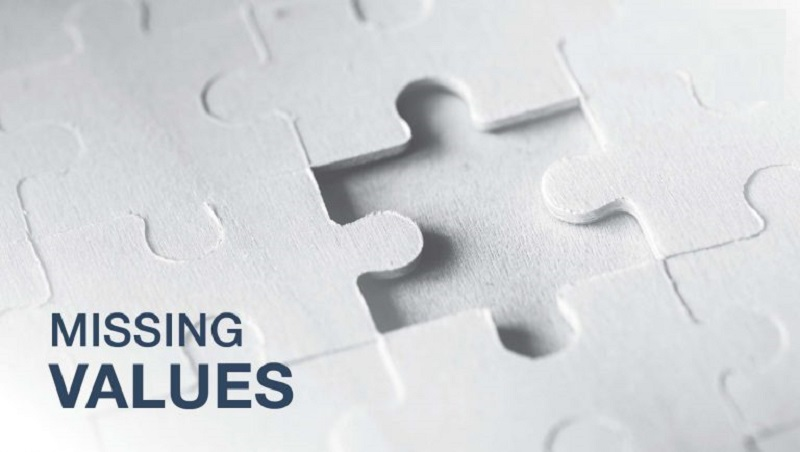

In [89]:
AirbnbData.isnull().head()

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,calculated_host_listings_count,availability_365,house_rules,license,year,month,day
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
2,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,True,True,True,True
3,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False


In [90]:
AirbnbData.isnull().sample(10)

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,calculated_host_listings_count,availability_365,house_rules,license,year,month,day
76354,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
26988,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
5194,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,True,True,True,True
66182,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False
28207,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,True,True,True,True
63038,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False
95325,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
76935,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False
16631,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
26996,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False


In [91]:
AirbnbData.isnull().sum()

id                                     0
listing_name                         250
host_id                                0
host_identity_verified               289
host_name                            404
neighbourhood_group                   29
neighbourhood                         16
latitude                               8
longitude                              8
country                              532
country_code                         131
instant_bookable                     105
cancellation_policy                   76
room_type                              0
construction_year                    214
price                                247
service_fee                          247
minimum_nights                       400
number_of_reviews                    183
last_review                        15832
reviews_per_month                  15818
rate                                 319
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [92]:
print(AirbnbData.isnull().sum().sum())

237269


In [93]:
print(AirbnbData.isna().any().sum())

26


In [94]:
print(AirbnbData.isna().any(axis=1).sum())

102057


In [95]:
def FindMissingColsPercentage(df):

    total = 0
    for col in df.columns:
        missing_vals = df[col].isnull().sum()
        # mean = sum / total
        pct = df[col].isnull().mean() * 100 
        if missing_vals != 0:
          print('{} => {} [{}%]'.format(col, df[col].isnull().sum(), round(pct, 2)))
        total += missing_vals
    
    if total == 0:
        print("no missing values")

In [96]:
FindMissingColsPercentage(AirbnbData)

listing_name => 250 [0.24%]
host_identity_verified => 289 [0.28%]
host_name => 404 [0.4%]
neighbourhood_group => 29 [0.03%]
neighbourhood => 16 [0.02%]
latitude => 8 [0.01%]
longitude => 8 [0.01%]
country => 532 [0.52%]
country_code => 131 [0.13%]
instant_bookable => 105 [0.1%]
cancellation_policy => 76 [0.07%]
construction_year => 214 [0.21%]
price => 247 [0.24%]
service_fee => 247 [0.24%]
minimum_nights => 400 [0.39%]
number_of_reviews => 183 [0.18%]
last_review => 15832 [15.51%]
reviews_per_month => 15818 [15.5%]
rate => 319 [0.31%]
calculated_host_listings_count => 319 [0.31%]
availability_365 => 448 [0.44%]
house_rules => 51842 [50.8%]
license => 102056 [100.0%]
year => 15832 [15.51%]
month => 15832 [15.51%]
day => 15832 [15.51%]


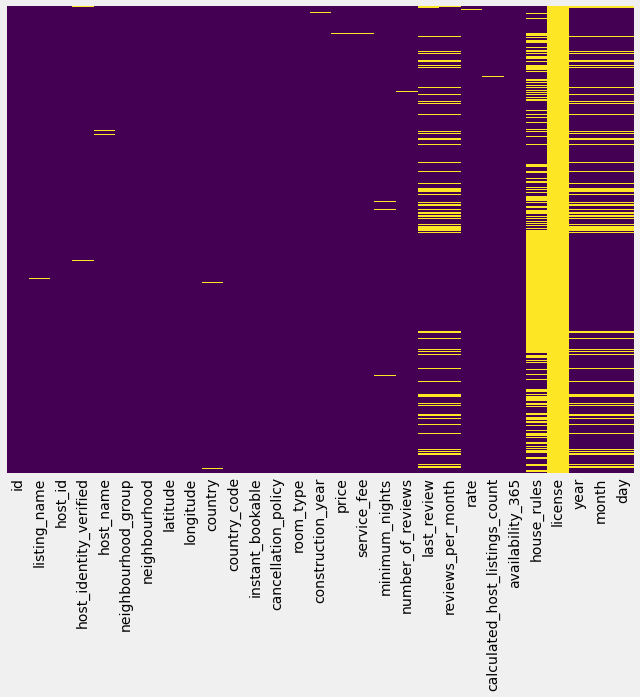

In [97]:
sns.heatmap(AirbnbData.isnull(), yticklabels=False, cmap='viridis', cbar=False);

### How to deal with missing data?

Dealing with missing data is not simple task, you have need to consider why the data is missing in the first place, and domain knowledge to know what to impute. 

There also isn't a specific threshold for what percentage of missing data is accepted, it depends on the data.

If you mess it up, you will introduce bias to your data.  


#### Techniques 
1. Drop feature 
1. Drop the rows
1. Impute missing values

In [98]:
# copying original data set is good practice when you're experimenting with things
# so you don't have to run all the cells before when you mess up something

AirbnbData_original = AirbnbData.copy()

In [99]:
AirbnbData.columns.tolist()

['id',
 'listing_name',
 'host_id',
 'host_identity_verified',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'country',
 'country_code',
 'instant_bookable',
 'cancellation_policy',
 'room_type',
 'construction_year',
 'price',
 'service_fee',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'rate',
 'calculated_host_listings_count',
 'availability_365',
 'house_rules',
 'license',
 'year',
 'month',
 'day']

In [100]:
FindMissingColsPercentage(AirbnbData)

listing_name => 250 [0.24%]
host_identity_verified => 289 [0.28%]
host_name => 404 [0.4%]
neighbourhood_group => 29 [0.03%]
neighbourhood => 16 [0.02%]
latitude => 8 [0.01%]
longitude => 8 [0.01%]
country => 532 [0.52%]
country_code => 131 [0.13%]
instant_bookable => 105 [0.1%]
cancellation_policy => 76 [0.07%]
construction_year => 214 [0.21%]
price => 247 [0.24%]
service_fee => 247 [0.24%]
minimum_nights => 400 [0.39%]
number_of_reviews => 183 [0.18%]
last_review => 15832 [15.51%]
reviews_per_month => 15818 [15.5%]
rate => 319 [0.31%]
calculated_host_listings_count => 319 [0.31%]
availability_365 => 448 [0.44%]
house_rules => 51842 [50.8%]
license => 102056 [100.0%]
year => 15832 [15.51%]
month => 15832 [15.51%]
day => 15832 [15.51%]


#### Create list of columns you want to drop
axis = 1 / 'columns' stands for column
axis = 0 / 'index' stands for row

In [101]:
colsToDrop = ['calculated_host_listings_count' , 'license']

AirbnbData.drop(colsToDrop, axis = 'columns', inplace = True)

In [102]:
AirbnbData.columns.tolist()

['id',
 'listing_name',
 'host_id',
 'host_identity_verified',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'country',
 'country_code',
 'instant_bookable',
 'cancellation_policy',
 'room_type',
 'construction_year',
 'price',
 'service_fee',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'rate',
 'availability_365',
 'house_rules',
 'year',
 'month',
 'day']

In [103]:
FindMissingColsPercentage(AirbnbData)

listing_name => 250 [0.24%]
host_identity_verified => 289 [0.28%]
host_name => 404 [0.4%]
neighbourhood_group => 29 [0.03%]
neighbourhood => 16 [0.02%]
latitude => 8 [0.01%]
longitude => 8 [0.01%]
country => 532 [0.52%]
country_code => 131 [0.13%]
instant_bookable => 105 [0.1%]
cancellation_policy => 76 [0.07%]
construction_year => 214 [0.21%]
price => 247 [0.24%]
service_fee => 247 [0.24%]
minimum_nights => 400 [0.39%]
number_of_reviews => 183 [0.18%]
last_review => 15832 [15.51%]
reviews_per_month => 15818 [15.5%]
rate => 319 [0.31%]
availability_365 => 448 [0.44%]
house_rules => 51842 [50.8%]
year => 15832 [15.51%]
month => 15832 [15.51%]
day => 15832 [15.51%]


In [104]:
print(AirbnbData.shape) 
print(AirbnbData.dropna().shape)

(102058, 27)
(39599, 27)


#### Impute missing values


- A constant value related to the data, such as 0 for `number_of_reviews`, or "None" for `listing_name`.
- The value before or after the data point (backward fill, forward fill)
- Summary statistics such as mean, median or mode value for the column.

### Imputing manually with pandas fillna

In [105]:
AirbnbData['listing_name'].head(5)

0                  Clean & quiet apt home by the park
1                               Skylit Midtown Castle
2                 THE VILLAGE OF HARLEM....NEW YORK !
3                                                 NaN
4    Entire Apt: Spacious Studio/Loft by central park
Name: listing_name, dtype: object

In [106]:
AirbnbData['reviews_per_month'].head(5)

0   0.21
1   0.38
2    NaN
3   4.64
4   0.10
Name: reviews_per_month, dtype: float64

In [107]:
missing_vals_replace = {'reviews_per_month': 0,
                        'listing_name':'None'}

AirbnbData.fillna(value = missing_vals_replace).head(5)['reviews_per_month']

0   0.21
1   0.38
2   0.00
3   4.64
4   0.10
Name: reviews_per_month, dtype: float64

In [108]:
# mean of reviews_per_month
reviews_mean = AirbnbData['reviews_per_month'].mean()
print(reviews_mean)
AirbnbData.fillna(value = {'reviews_per_month' : reviews_mean}).head(5)['reviews_per_month']

1.3754082792207878


0   0.21
1   0.38
2   1.38
3   4.64
4   0.10
Name: reviews_per_month, dtype: float64

In [109]:
# median of reviews_per_month
reviews_median = AirbnbData['reviews_per_month'].median()
print(reviews_median)

AirbnbData.fillna(value = {'reviews_per_month' : reviews_median}).head(5)['reviews_per_month']

0.74


0   0.21
1   0.38
2   0.74
3   4.64
4   0.10
Name: reviews_per_month, dtype: float64

In [110]:
AirbnbData['reviews_per_month'].head()

0   0.21
1   0.38
2    NaN
3   4.64
4   0.10
Name: reviews_per_month, dtype: float64

In [111]:
# imputing with bfill
AirbnbData['reviews_per_month'].bfill().head()

0   0.21
1   0.38
2   4.64
3   4.64
4   0.10
Name: reviews_per_month, dtype: float64

In [112]:
# imputing with ffill
AirbnbData['reviews_per_month'].ffill().head()

0   0.21
1   0.38
2   0.38
3   4.64
4   0.10
Name: reviews_per_month, dtype: float64

In [113]:
AirbnbData['reviews_per_month'].head()

0   0.21
1   0.38
2    NaN
3   4.64
4   0.10
Name: reviews_per_month, dtype: float64

In [114]:
missing_vals_replace = {'reviews_per_month':0,
                        'listing_name':'None'}

AirbnbData.fillna(missing_vals_replace, inplace = True)

In [115]:
AirbnbData['last_review'].head(3)

0   2021-10-19
1   2022-05-21
2          NaT
Name: last_review, dtype: datetime64[ns]

In [116]:
AirbnbData['last_review'].ffill().head(3)

0   2021-10-19
1   2022-05-21
2   2022-05-21
Name: last_review, dtype: datetime64[ns]

In [117]:
AirbnbData['last_review'].ffill(inplace=True)

In [118]:
# Int64 are pandas data types that can handle missing values
AirbnbData['year'] = AirbnbData['last_review'].dt.year.astype('Int64')
AirbnbData['month'] = AirbnbData['last_review'].dt.month.astype('Int64')
AirbnbData['day'] = AirbnbData['last_review'].dt.day.astype('Int64')

In [119]:
FindMissingColsPercentage(AirbnbData)

host_identity_verified => 289 [0.28%]
host_name => 404 [0.4%]
neighbourhood_group => 29 [0.03%]
neighbourhood => 16 [0.02%]
latitude => 8 [0.01%]
longitude => 8 [0.01%]
country => 532 [0.52%]
country_code => 131 [0.13%]
instant_bookable => 105 [0.1%]
cancellation_policy => 76 [0.07%]
construction_year => 214 [0.21%]
price => 247 [0.24%]
service_fee => 247 [0.24%]
minimum_nights => 400 [0.39%]
number_of_reviews => 183 [0.18%]
rate => 319 [0.31%]
availability_365 => 448 [0.44%]
house_rules => 51842 [50.8%]


In [120]:
AirbnbData.fillna({'availability_365':1}, inplace = True)

In [121]:
AirbnbData.fillna({'number_of_reviews':0}, inplace = True)

In [122]:
AirbnbData.fillna({'minimum_nights' : 1}, inplace = True)

In [123]:
rate_median = AirbnbData['rate'].median()
print(rate_median)

3.0


In [124]:
AirbnbData.fillna(value = {'rate' : rate_median},inplace = True)

In [125]:
FindMissingColsPercentage(AirbnbData)

host_identity_verified => 289 [0.28%]
host_name => 404 [0.4%]
neighbourhood_group => 29 [0.03%]
neighbourhood => 16 [0.02%]
latitude => 8 [0.01%]
longitude => 8 [0.01%]
country => 532 [0.52%]
country_code => 131 [0.13%]
instant_bookable => 105 [0.1%]
cancellation_policy => 76 [0.07%]
construction_year => 214 [0.21%]
price => 247 [0.24%]
service_fee => 247 [0.24%]
house_rules => 51842 [50.8%]


In [126]:
# AirbnbData['construction_year'] = AirbnbData['construction_year'].astype('float')

In [127]:
construction_median = AirbnbData['construction_year'].median()
print(construction_median)

2012.0


In [128]:
AirbnbData.fillna(value = {'construction_year' : construction_median},inplace = True)

In [129]:
AirbnbData["house_rules"].head(20)

0     Clean up and treat the home the way you'd like...
1     Pet friendly but please confirm with me if the...
2     I encourage you to use my kitchen, cooking and...
3                                                   NaN
4     Please no smoking in the house, porch or on th...
5                     No smoking, please, and no drugs.
6     Please no shoes in the house so bring slippers...
7     House Guidelines for our BnB We are delighted ...
8     - Please clean up after yourself when using th...
9     NO SMOKING OR PETS ANYWHERE ON THE PROPERTY 1....
10                                                  NaN
11    My ideal guests would be warm, friendly, and r...
12    - One of the bedroom closets is not accessible...
13                                                  NaN
14                                                  NaN
15    Arrival time can be no later than 9:00PM unles...
16    Absolutely no smoking in the building, handlin...
17    - Please be mindful of the neighbors, quie

In [130]:
FindMissingColsPercentage(AirbnbData)

host_identity_verified => 289 [0.28%]
host_name => 404 [0.4%]
neighbourhood_group => 29 [0.03%]
neighbourhood => 16 [0.02%]
latitude => 8 [0.01%]
longitude => 8 [0.01%]
country => 532 [0.52%]
country_code => 131 [0.13%]
instant_bookable => 105 [0.1%]
cancellation_policy => 76 [0.07%]
price => 247 [0.24%]
service_fee => 247 [0.24%]
house_rules => 51842 [50.8%]


In [131]:
missing_vals_replace = {'service_fee':0,
                        'host_name':'None' ,
                        'house_rules' : 'No Smoking'
                       }

AirbnbData.fillna(missing_vals_replace, inplace = True)

In [132]:
# AirbnbData['host_name'].fillna("NOT DEFINED", inplace=True)

In [133]:
FindMissingColsPercentage(AirbnbData)

host_identity_verified => 289 [0.28%]
neighbourhood_group => 29 [0.03%]
neighbourhood => 16 [0.02%]
latitude => 8 [0.01%]
longitude => 8 [0.01%]
country => 532 [0.52%]
country_code => 131 [0.13%]
instant_bookable => 105 [0.1%]
cancellation_policy => 76 [0.07%]
price => 247 [0.24%]


In [134]:
AirbnbData.head(5)

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,United States,US,False,strict,Private room,"2,020.00",966.00,966.00,10.00,9.00,2021-10-19,0.21,4.00,286.00,Clean up and treat the home the way you'd like...,2021,10,19
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75,-73.98,United States,US,False,moderate,Entire home/apt,"2,007.00",142.00,142.00,30.00,45.00,2022-05-21,0.38,4.00,228.00,Pet friendly but please confirm with me if the...,2022,5,21
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.81,-73.94,United States,US,True,flexible,Private room,"2,005.00",620.00,620.00,3.00,0.00,2022-05-21,0.00,5.00,352.00,"I encourage you to use my kitchen, cooking and...",2022,5,21
3,1002755,None,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.69,-73.96,United States,US,True,moderate,Entire home/apt,"2,005.00",368.00,368.00,30.00,270.00,2019-07-05,4.64,4.00,322.00,No Smoking,2019,7,5
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.80,-73.94,United States,US,False,moderate,Entire home/apt,"2,009.00",204.00,204.00,10.00,9.00,2018-11-19,0.10,3.00,289.00,"Please no smoking in the house, porch or on th...",2018,11,19


In [135]:
missing_vals_replace = {'host_identity_verified':'unconfirmed',
                        'cancellation_policy':'flexible' ,
                        'instant_bookable' : False
                       }

AirbnbData.fillna(missing_vals_replace, inplace = True)

In [136]:
FindMissingColsPercentage(AirbnbData)

neighbourhood_group => 29 [0.03%]
neighbourhood => 16 [0.02%]
latitude => 8 [0.01%]
longitude => 8 [0.01%]
country => 532 [0.52%]
country_code => 131 [0.13%]
price => 247 [0.24%]


In [137]:
#first_quantile, third_quantile = price.quantile([0.25,0.75])

In [138]:
price_mean = AirbnbData['price'].mean()
print(price_mean)

625.355580438263


In [139]:
AirbnbData.fillna(value = {'price' : price_mean},inplace = True)

In [140]:
FindMissingColsPercentage(AirbnbData)

neighbourhood_group => 29 [0.03%]
neighbourhood => 16 [0.02%]
latitude => 8 [0.01%]
longitude => 8 [0.01%]
country => 532 [0.52%]
country_code => 131 [0.13%]


In [141]:
missing_vals_replace = {'country':'United States',
                        'country_code':'US'}

AirbnbData.fillna(missing_vals_replace, inplace = True)

In [142]:
print(AirbnbData.shape) 
print(AirbnbData.dropna().shape)

(102058, 27)
(102005, 27)


In [143]:
AirbnbData.dropna(inplace = True)

In [144]:
FindMissingColsPercentage(AirbnbData)

no missing values


In [145]:
AirbnbData.isnull().any()

id                        False
listing_name              False
host_id                   False
host_identity_verified    False
host_name                 False
neighbourhood_group       False
neighbourhood             False
latitude                  False
longitude                 False
country                   False
country_code              False
instant_bookable          False
cancellation_policy       False
room_type                 False
construction_year         False
price                     False
service_fee               False
minimum_nights            False
number_of_reviews         False
last_review               False
reviews_per_month         False
rate                      False
availability_365          False
house_rules               False
year                      False
month                     False
day                       False
dtype: bool


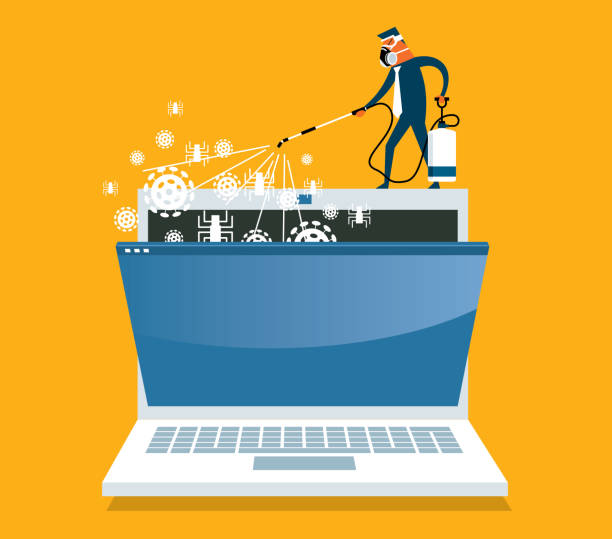



### Data Inconsistencies Check
out of range data

* Are the values in the column available 365 within 365?

* it's nonsense if the number of this column be less/equal than 0

* Is the year in the column year over 2024 ?

* if we have 0 reviews per month so we have to have a 0 in the number of reviews columns

* minimum_nights has to be over than 0 and les than 365

* Are latitude and longitude coords valid coordinates?

> Latitude and longitude are a pair of numbers (coordinates) used to describe a position on the plane of a geographic coordinate system. The numbers are in decimal degrees format and range from -90 to 90 for latitude and -180 to 180 for longitude.


* Categorical data inconsistency

> caused by human error (wrong spelling, different case categories)

In [146]:
AirbnbData['availability_365'].describe()

count   102,005.00
mean        140.43
std         135.45
min         -10.00
25%           2.00
50%          95.00
75%         268.00
max       3,677.00
Name: availability_365, dtype: float64

In [147]:
AirbnbData.loc[(AirbnbData.availability_365 > 365)]

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day
5,1004098,Large Cozy 1 BR Apartment In Midtown East,45498551794,verified,Michelle,Manhattan,Murray Hill,40.75,-73.97,United States,US,True,flexible,Entire home/apt,"2,013.00",577.00,577.00,3.00,74.00,2019-06-22,0.59,3.00,374.00,"No smoking, please, and no drugs.",2019,6,22
9,1006307,Cozy Clean Guest Room - Family Apt,75527839483,unconfirmed,Carl,Manhattan,Upper West Side,40.80,-73.97,United States,US,False,strict,Private room,"2,015.00",291.00,291.00,2.00,118.00,2017-07-21,0.99,5.00,375.00,NO SMOKING OR PETS ANYWHERE ON THE PROPERTY 1....,2017,7,21
25,1015144,"MAISON DES SIRENES1,bohemian apartment",48387947293,unconfirmed,Miranda,Brooklyn,Bedford-Stuyvesant,40.68,-73.94,United States,US,False,strict,Entire home/apt,"2,006.00","1,175.00","1,175.00",2.00,88.00,2019-06-19,0.73,4.00,372.00,No Smoking,2019,6,19
33,1019562,Loft in Williamsburg Area w/ Roof,50968902783,unconfirmed,John,Brooklyn,Greenpoint,40.72,-73.94,United States,US,False,moderate,Private room,"2,007.00",858.00,858.00,4.00,197.00,2019-06-15,1.65,3.00,383.00,LAUNDRY - Laundry can be done by the visitor b...,2019,6,15
34,1020114,back room/bunk beds,25066620900,verified,Alfred,Manhattan,Harlem,40.82,-73.95,United States,US,False,strict,Private room,"2,021.00",545.00,545.00,3.00,273.00,2019-07-01,2.37,3.00,411.00,Please no smoking on the property,2019,7,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86857,48972457,Terrific Master Bedroom/Bath in Great UWS Loca...,28355973401,verified,Judah,Manhattan,Upper West Side,40.79,-73.97,United States,US,True,flexible,Private room,"2,019.00",969.00,969.00,5.00,3.00,2019-06-13,0.08,2.00,380.00,1. You must be 25 years of age to rent this ho...,2019,6,13
86858,48973009,Private Green Apple Brownstone Studio Harlem NYC,64063830206,unconfirmed,Ephraim,Manhattan,Harlem,40.82,-73.95,United States,US,True,flexible,Entire home/apt,"2,003.00",749.00,749.00,4.00,125.00,2019-06-20,3.37,4.00,409.00,We love our home and enjoy sharing it with oth...,2019,6,20
86874,48981846,Chill Private Room in Extremely Convenient Place,35575007933,unconfirmed,Josh,Manhattan,Upper West Side,40.77,-73.99,United States,US,True,strict,Private room,"2,018.00",643.00,643.00,1.00,1.00,2016-08-09,0.03,5.00,383.00,No Smoking,2016,8,9
86875,48982399,Cozy Couch in Wburg,83904536534,verified,Chris,Brooklyn,Williamsburg,40.71,-73.96,United States,US,False,moderate,Shared room,"2,012.00","1,139.00","1,139.00",1.00,0.00,2016-08-09,0.00,5.00,379.00,No Smoking,2016,8,9


In [148]:
AirbnbData.loc[AirbnbData.availability_365>365 , 'availability_365'] = 365

In [149]:
AirbnbData.loc[(AirbnbData.availability_365 > 365)]

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day


In [150]:
AirbnbData.loc[(AirbnbData.availability_365 < 0)]

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day
139,1078106,FLAT MACDONOUGH,12359551036,unconfirmed,Frederick,Brooklyn,Bedford-Stuyvesant,40.68,-73.94,United States,US,False,flexible,Entire home/apt,"2,010.00",593.00,593.00,1.00,227.00,2019-06-23,2.09,5.00,-10.00,No Smoking,2019,6,23
142,1079763,"Sun-drenched, artsy modernist 1 BDRM duplex",83716006050,unconfirmed,Kellan,Brooklyn,Williamsburg,40.72,-73.95,United States,US,True,moderate,Entire home/apt,"2,004.00",658.00,658.00,1.00,10.00,2019-06-23,0.10,5.00,-2.00,Quiet after 11pm. Other guests sleeping.,2019,6,23
170,1095227,New York room with a view,95792367490,unconfirmed,Dexter,Staten Island,St. George,40.65,-74.08,United States,US,True,strict,Private room,"2,003.00","1,015.00","1,015.00",131.00,166.00,2019-06-13,1.66,4.00,-1.00,Please tell me about who you will be traveling...,2019,6,13
236,1131679,None,74291995690,unconfirmed,Cameron,Manhattan,East Harlem,40.79,-73.95,United States,US,False,flexible,Entire home/apt,"2,020.00","1,052.00","1,052.00",28.00,183.00,2018-09-29,1.83,2.00,-6.00,- We have school age children and request that...,2018,9,29
251,1139963,B NYC Staten Alternative...,13992927619,unconfirmed,Fowler,Staten Island,Tompkinsville,40.64,-74.09,United States,US,True,strict,Private room,"2,017.00",784.00,784.00,2.00,147.00,2019-05-26,0.00,3.00,-1.00,"Rules are detailed in the House Manual, which ...",2019,5,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86675,48871939,Private Condo Room w/ Patio,35368820987,verified,Agustina,Bronx,Longwood,40.82,-73.91,United States,US,False,moderate,Private room,"2,005.00",614.00,614.00,2.00,68.00,2019-05-30,1.83,2.00,-7.00,No Smoking,2019,5,30
86735,48905077,Comfortable 2 BR in East Village/Cooper Square,66319244844,unconfirmed,Cooper,Manhattan,East Village,40.73,-73.99,United States,US,True,moderate,Entire home/apt,"2,005.00",335.00,335.00,3.00,27.00,2019-04-23,0.76,5.00,-4.00,No Smoking in the Apartment. Pretty laid back...,2019,4,23
86764,48921093,"Beautiful hip location, with a light of sunshine.",11182626298,verified,Noemi,Queens,Ridgewood,40.71,-73.90,United States,US,False,flexible,Entire home/apt,"2,009.00",606.00,606.00,28.00,1.00,2018-09-15,0.10,4.00,-2.00,No Smoking,2018,9,15
86790,48935453,Beautiful Quiet Bedroom near City College,59344299465,unconfirmed,Erika,Manhattan,Harlem,40.82,-73.95,United States,US,False,strict,Private room,"2,017.00",948.00,948.00,2.00,0.00,2019-05-06,0.00,4.00,-7.00,Please be respectful of other guests. Keep th...,2019,5,6


In [151]:
AirbnbData.loc[AirbnbData.availability_365<0 , 'availability_365'] = 0

In [152]:
AirbnbData.loc[(AirbnbData.availability_365 < 0)]

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day


In [153]:
AirbnbData['reviews_per_month'].describe()

count   102,005.00
mean          1.16
std           1.68
min           0.00
25%           0.09
50%           0.48
75%           1.71
max          90.00
Name: reviews_per_month, dtype: float64

In [154]:
AirbnbData['minimum_nights'].describe()

count   102,005.00
mean          8.10
std          30.56
min      -1,223.00
25%           1.00
50%           3.00
75%           5.00
max       5,645.00
Name: minimum_nights, dtype: float64

In [155]:
AirbnbData.loc[AirbnbData.minimum_nights<1 , 'minimum_nights'] = 1

In [156]:
AirbnbData.loc[AirbnbData.minimum_nights>365 , 'minimum_nights'] = 365

In [157]:
AirbnbData['minimum_nights'].describe()

count   102,005.00
mean          7.94
std          18.26
min           1.00
25%           1.00
50%           3.00
75%           5.00
max         365.00
Name: minimum_nights, dtype: float64

### assert Keyword
> Python’s assert statement allows you to write sanity checks in your code. These checks are known as assertions, and you can use them to test if certain assumptions remain true while you’re developing your code. If any of your assertions turn false, then you have a bug in your code.


### Definition and Usage
The assert keyword is used when debugging code.
The assert keyword lets you test if a condition in your code returns True, if not, the program will raise an AssertionError.
You can write a message to be written if the code returns False, check the example below.

In [158]:
assert 10 + 10 == 20

In [159]:
assert arian + 1 == arianazmoudeh

NameError: name 'arian' is not defined

### Are latitude and longitude coords valid coordinates?

* Latitude and longitude are a pair of numbers (coordinates) used to describe a position on the plane of a geographic coordinate system. The numbers are in decimal degrees format and range from -90 to 90 for latitude and -180 to 180 for longitude.

In [160]:
AirbnbData['latitude'].describe()

count   102,005.00
mean         40.73
std           0.06
min          40.50
25%          40.69
50%          40.72
75%          40.76
max          40.92
Name: latitude, dtype: float64

In [161]:
AirbnbData['longitude'].describe()

count   102,005.00
mean        -73.95
std           0.05
min         -74.25
25%         -73.98
50%         -73.95
75%         -73.93
max         -73.71
Name: longitude, dtype: float64

### Categorical data inconsistency

- caused by human error (wrong spelling, different case categories)

In [162]:
# show categories
AirbnbData['neighbourhood_group'].unique()

['Brooklyn', 'Manhattan', 'brookln', 'manhatan', 'Queens', 'Staten Island', 'Bronx']
Categories (7, object): ['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'brookln', 'manhatan']

In [163]:
# replace the wrong spelling with right spelling

wrong_spelling = ['brookln', 'manhatan']
right_spelling = ['Brooklyn', 'Manhattan']

AirbnbData['neighbourhood_group'].replace(to_replace = wrong_spelling, 
                                  value = right_spelling, 
                                  inplace = True)

In [164]:
AirbnbData['neighbourhood_group'].unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [165]:
AirbnbData['neighbourhood_group'].dtype

dtype('O')

In [166]:
AirbnbData['neighbourhood_group'] = AirbnbData['neighbourhood_group'].astype('category')

In [167]:
AirbnbData['neighbourhood_group'].dtype

CategoricalDtype(categories=['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island'], ordered=False)

In [168]:
AirbnbData['neighbourhood'].unique()

['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem', ..., 'Breezy Point', 'Willowbrook', 'Glen Oaks', 'Gerritsen Beach', 'Chelsea, Staten Island']
Length: 224
Categories (224, object): ['Allerton', 'Arden Heights', 'Arrochar', 'Arverne', ..., 'Woodhaven', 'Woodlawn', 'Woodrow', 'Woodside']

In [169]:
AirbnbData['neighbourhood'] = AirbnbData['neighbourhood'].astype('category')

In [170]:
AirbnbData['neighbourhood'].dtype

CategoricalDtype(categories=['Allerton', 'Arden Heights', 'Arrochar', 'Arverne',
                  'Astoria', 'Bath Beach', 'Battery Park City', 'Bay Ridge',
                  'Bay Terrace', 'Bay Terrace, Staten Island',
                  ...
                  'Westerleigh', 'Whitestone', 'Williamsbridge',
                  'Williamsburg', 'Willowbrook', 'Windsor Terrace',
                  'Woodhaven', 'Woodlawn', 'Woodrow', 'Woodside'],
, ordered=False)

## Creating Some New features for better usability

In [171]:
conditionList = [AirbnbData['construction_year'] >= 2018 , 
                 AirbnbData['construction_year'] >= 2010 ,
                 AirbnbData['construction_year'] < 2010]

resultList = ["Newly built", "Old House", "historic house"]

In [172]:
AirbnbData["house_quality"] = np.select(conditionList, resultList)

In [173]:
AirbnbData.sample(5)

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day,house_quality
86791,48936005,"*Cozy apt Manhattan,Near Central Park !*",39331684706,verified,Anna,Manhattan,Upper East Side,40.77,-73.95,United States,US,True,strict,Private room,"2,017.00","1,154.00","1,154.00",1.00,65.00,2019-06-30,1.76,3.00,42.00,No Smoking,2019,6,30,Old House
93124,52433721,Spacious and Serene in Manhattan! 2 beds,15828211065,unconfirmed,Tanya,Manhattan,Washington Heights,40.85,-73.94,United States,US,True,flexible,Entire home/apt,"2,003.00","1,053.00","1,053.00",2.00,3.00,2018-05-20,0.20,2.00,0.00,No Smoking,2018,5,20,historic house
24674,14628786,UPPER WEST SIDE | 1 BEDROOM | Lincoln Center,29236326907,unconfirmed,Emily,Manhattan,Upper West Side,40.77,-73.99,United States,US,False,moderate,Entire home/apt,"2,005.00","1,178.00","1,178.00",30.00,8.00,2019-06-03,0.36,1.00,330.00,Check-in is after 3PM Some general information...,2019,6,3,historic house
28189,16570121,Room in the heart of Bushwick,630697980,unconfirmed,Zoe,Brooklyn,Bushwick,40.70,-73.92,United States,US,False,strict,Private room,"2,008.00",211.00,211.00,2.00,3.00,2019-04-09,0.48,3.00,0.00,No Smoking,2019,4,9,historic house
12991,8176265,Deluxe Furnished 1-Bedroom Midtown West Apartment,32547477588,unconfirmed,Kara,Manhattan,Theater District,40.76,-73.98,United States,US,False,strict,Entire home/apt,"2,003.00",754.00,754.00,30.00,0.00,2015-12-30,0.00,2.00,136.00,No Smoking,2015,12,30,historic house


In [174]:
AirbnbData['house_quality'] = AirbnbData['house_quality'].astype('category')

In [175]:
AirbnbData['house_quality'].unique()

['Newly built', 'historic house', 'Old House']
Categories (3, object): ['Newly built', 'Old House', 'historic house']

In [176]:
AirbnbData["house_quality"].value_counts()

Old House         40757
historic house    35806
Newly built       25442
Name: house_quality, dtype: int64

In [177]:
conditionList = [AirbnbData['rate'] >= 4 , 
                 AirbnbData['rate'] >= 3 ,
                 AirbnbData['rate'] < 3]

resultList = ["top rate", "normal rate", "bad rate"]

In [178]:
AirbnbData["house_rate"] = np.select(conditionList, resultList)

In [179]:
AirbnbData['house_rate'] = AirbnbData['house_rate'].astype('category')

In [180]:
AirbnbData['house_rate'].unique()

['top rate', 'normal rate', 'bad rate']
Categories (3, object): ['bad rate', 'normal rate', 'top rate']

In [181]:
AirbnbData["house_rate"].value_counts()

top rate       46427
bad rate       32140
normal rate    23438
Name: house_rate, dtype: int64

In [182]:
AirbnbData["total_price"] = AirbnbData['price'] + AirbnbData['service_fee']

In [183]:
AirbnbData.sample(5)

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day,house_quality,house_rate,total_price
52480,29986040,2-bdrm private suite safe area near Prospect Park,75055885490,verified,Mary,Brooklyn,Windsor Terrace,40.66,-73.98,United States,US,True,moderate,Entire home/apt,"2,019.00",588.00,588.00,1.00,7.00,2022-02-21,0.49,2.00,64.00,No Smoking,2022,2,21,Newly built,bad rate,"1,176.00"
38944,22510107,Modern Williamsburg Beauty,49079373454,unconfirmed,Michael,Brooklyn,Williamsburg,40.71,-73.95,United States,US,True,flexible,Private room,"2,012.00","1,146.00","1,146.00",4.00,0.00,2019-04-08,0.00,3.00,35.00,"First and foremost, treat this house like you ...",2019,4,8,Old House,normal rate,"2,292.00"
44744,25713447,"Your Luxury Manhattan Mansion! Quiet, Near it ...",25021280805,unconfirmed,Natalia,Manhattan,West Village,40.74,-74.01,United States,US,False,flexible,Entire home/apt,"2,016.00",576.00,576.00,2.00,1.00,2019-06-05,0.88,2.00,61.00,No Smoking,2019,6,5,Old House,bad rate,"1,152.00"
27180,16012850,Oasis: Cozy Comfy,83007058861,unconfirmed,Sharon,Bronx,Concourse,40.82,-73.93,United States,US,False,flexible,Entire home/apt,"2,009.00",919.00,919.00,2.00,79.00,2019-07-01,3.88,2.00,283.00,No guests over other than the ones in your boo...,2019,7,1,historic house,bad rate,"1,838.00"
91050,51288251,"Snug, Cozy 1 bedroom Apartment",2291926732,unconfirmed,Dwane,Brooklyn,East New York,40.66,-73.90,United States,US,False,strict,Entire home/apt,"2,008.00",923.00,923.00,1.00,68.00,2019-06-08,2.27,2.00,364.00,Quiet and clean Responsible person No bad habi...,2019,6,8,historic house,bad rate,"1,846.00"


In [184]:
AirbnbData["house_price_value"] = np.where(AirbnbData['total_price'] > 2000 , "High Price"
                              , np.where(AirbnbData['total_price'] > 800 , "medium price"
                              , np.where(AirbnbData['total_price'] > 400  , "low price"  , "cheep")))


In [185]:
AirbnbData["house_price_value"].value_counts()

medium price    53362
low price       17727
High Price      17701
cheep           13215
Name: house_price_value, dtype: int64

In [186]:
AirbnbData['house_price_value'] = AirbnbData['house_price_value'].astype('category')

In [187]:
AirbnbData.sample(5)

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day,house_quality,house_rate,total_price,house_price_value
99833,56139102,PRIVATE ROOM CLOSE TO THE CITY AND JFK AIRPORT.,60439970412,unconfirmed,Maria,Queens,Woodhaven,40.69,-73.86,United States,US,False,flexible,Private room,"2,004.00",906.00,906.00,4.00,22.00,2019-07-01,0.68,5.00,266.00,No Smoking,2019,7,1,historic house,top rate,"1,812.00",medium price
14893,9226740,Small studio/Central Park/Upper West Side,16368941558,unconfirmed,Mary,Manhattan,Upper West Side,40.78,-73.98,United States,US,False,strict,Entire home/apt,"2,022.00",504.00,504.00,3.00,78.00,2019-06-21,1.95,3.00,4.00,Please remember that this is a residential bui...,2019,6,21,Newly built,normal rate,"1,008.00",medium price
101223,56906799,Delight in Your Home Away from Home in NYC!,4065704908,verified,Paul,Bronx,Soundview,40.83,-73.87,United States,US,True,strict,Entire home/apt,"2,016.00",872.00,872.00,2.00,105.00,2019-06-11,3.61,3.00,131.00,"WHEN BOOKING, PLEASE PROVIDE THE FOLLOWING IN ...",2019,6,11,Old House,normal rate,"1,744.00",medium price
85028,47962300,Comfy KING bed in modern NYC apt,96128402187,verified,Mrs. Alabi,Brooklyn,Crown Heights,40.67,-73.93,United States,US,False,moderate,Private room,"2,011.00",246.00,246.00,2.00,129.00,2019-06-26,3.32,4.00,197.00,Shoes off apartment (slippers available to gue...,2019,6,26,Old House,top rate,492.00,low price
88871,50084789,Gorgeous Bedroom in Brooklyn,31420651420,verified,Amaru,Brooklyn,Flatbush,40.64,-73.95,United States,US,False,flexible,Private room,"2,005.00",840.00,840.00,3.00,28.00,2019-06-15,2.64,5.00,54.00,"Just be respectful, that's really all I ask. ...",2019,6,15,historic house,top rate,"1,680.00",medium price


In [188]:
AirbnbData.columns.to_list()

['id',
 'listing_name',
 'host_id',
 'host_identity_verified',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'country',
 'country_code',
 'instant_bookable',
 'cancellation_policy',
 'room_type',
 'construction_year',
 'price',
 'service_fee',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'rate',
 'availability_365',
 'house_rules',
 'year',
 'month',
 'day',
 'house_quality',
 'house_rate',
 'total_price',
 'house_price_value']

In [189]:
freqFile = open('freqFile.txt', 'w')

for col in AirbnbData[["construction_year" , "total_price", "rate" , 'availability_365']] :
    print(col, "-----------------------------------", 'frequencies',
          AirbnbData[col].value_counts(), "percentages", AirbnbData[col].value_counts(normalize=True),
         sep="\n\n", end="\n\n", file=freqFile
         
         )
    
freqFile.close()

In [190]:
def testnorm(var, FinanceData):
    stat, p = scistat.shapiro(FinanceData[var])
    return p

In [191]:
testnorm("price", AirbnbData)

# The test rejects the hypothesis of normality when the p-value is less than or equal to 0.05. 

0.0

In [192]:
from scipy.stats import shapiro
testdata = AirbnbData['price']
shapiro(testdata)


#So, when you get a p-value of 0.000, you should compare it to the significance level. Common significance levels include 0.1, 0.05, and 0.01.
# Since 0.000 is lower than all of these significance levels, we would reject the null hypothesis in each case.

ShapiroResult(statistic=0.9557701349258423, pvalue=0.0)

## Outliers

> In statistics, an outlier is a data point that differs significantly from other observations.An outlier may be due to variability in the measurement or it may indicate experimental error; the latter are sometimes excluded from the data set. 

## Dealing with outliers
> Once you’ve identified outliers, you’ll decide what to do with them in your dataset. Your main options are retaining or removing them.

> In general, you should try to accept outliers as much as possible unless it’s clear that they represent errors or bad data.


## How to detect?
- with boxplots and histograms
- statistical methods like IQR, skewness, etc.

> To choose the best way to handle outliers one must have a good domain knowledge and information about where the data come from and what they mean ; it also depends on what analysis one is planning to perform.



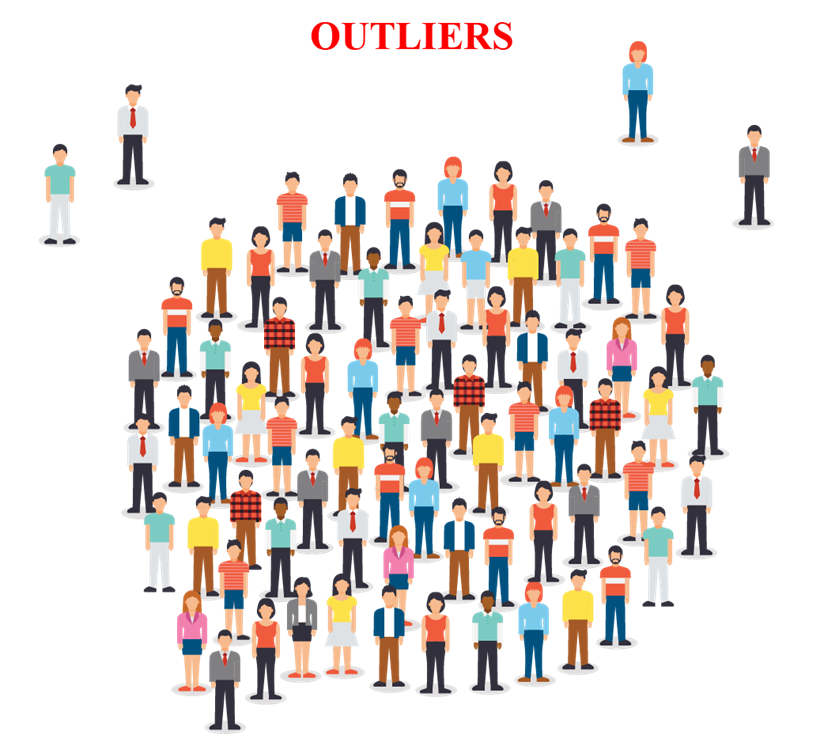


In [193]:
AirbnbData.corr(method="pearson")

,id,host_id,latitude,longitude,construction_year,price,service_fee,minimum_nights,number_of_reviews,reviews_per_month,rate,availability_365,year,month,day,total_price
id,1.00,-0.00,-0.01,0.04,0.00,0.01,0.01,0.02,-0.04,0.05,0.04,-0.13,0.16,-0.00,0.00,0.01
host_id,-0.00,1.00,0.00,-0.01,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00
latitude,-0.01,0.00,1.00,0.07,0.01,-0.01,-0.01,0.03,-0.03,-0.03,-0.00,-0.01,-0.03,0.01,-0.01,-0.01
longitude,0.04,-0.01,0.07,1.00,0.00,0.00,0.00,-0.06,0.07,0.12,0.02,0.06,0.11,-0.02,-0.01,0.00
construction_year,0.00,0.00,0.01,0.00,1.00,-0.00,-0.00,-0.00,0.00,0.00,0.01,-0.01,0.00,-0.00,-0.00,-0.00
price,0.01,0.00,-0.01,0.00,-0.00,1.00,1.00,-0.00,0.01,0.01,-0.00,-0.00,0.00,-0.00,-0.00,1.00
service_fee,0.01,0.00,-0.01,0.00,-0.00,1.00,1.00,-0.01,0.01,0.01,-0.00,-0.00,0.00,-0.00,0.00,1.00
minimum_nights,0.02,-0.00,0.03,-0.06,-0.00,-0.00,-0.01,1.00,-0.08,-0.15,-0.00,0.10,0.05,0.02,0.01,-0.00
number_of_reviews,-0.04,-0.00,-0.03,0.07,0.00,0.01,0.01,-0.08,1.00,0.62,-0.02,0.10,0.24,-0.08,0.02,0.01
reviews_per_month,0.05,-0.00,-0.03,0.12,0.00,0.01,0.01,-0.15,0.62,1.00,0.03,0.08,0.28,-0.10,0.01,0.01


<AxesSubplot:>

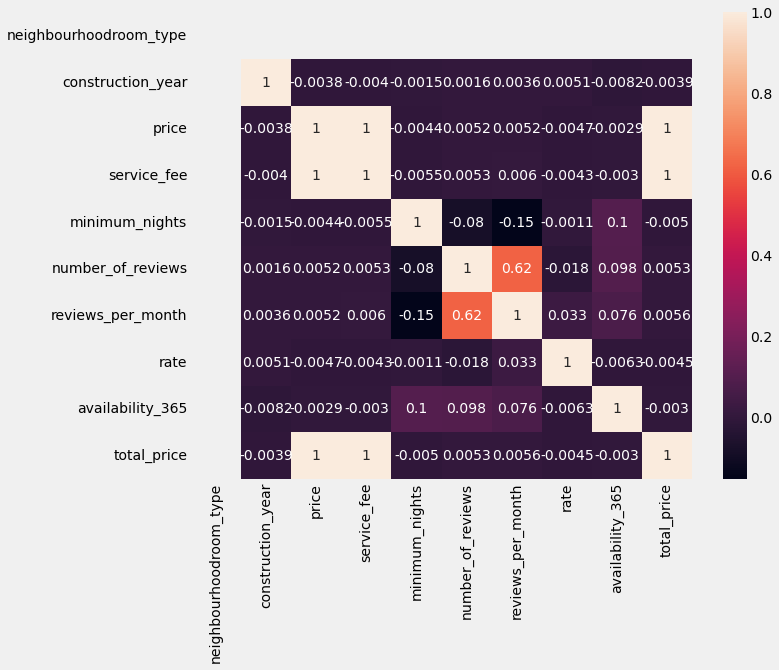

In [194]:
AirbnbCorrData = pd.DataFrame(AirbnbData,columns=["neighbourhood_group",'neighbourhood' 'room_type' , 'construction_year' , 'price' , 'service_fee','minimum_nights', 'number_of_reviews', 'last_review','reviews_per_month', 'rate', 'availability_365','house_quality', 'house_rate', 'total_price','house_price_value'])

corrMatrix = AirbnbCorrData.corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

In [195]:
AirbnbData['price'].describe()

count   102,005.00
mean        625.34
std         331.29
min          50.00
25%         341.00
50%         625.36
75%         912.00
max       1,200.00
Name: price, dtype: float64

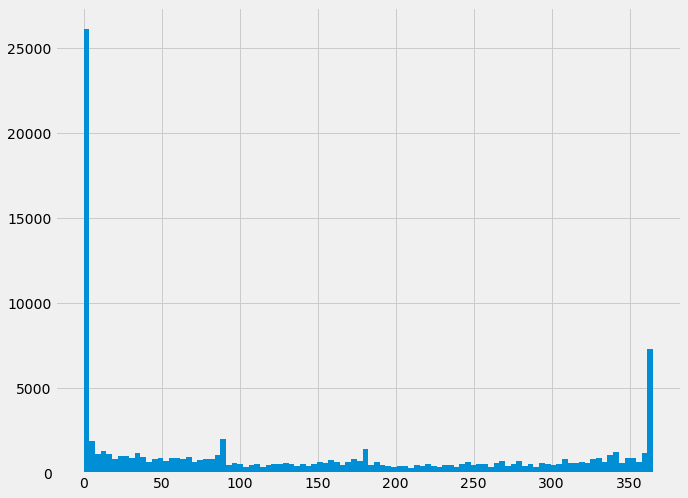

In [196]:
AirbnbData['availability_365'].hist(bins=100);

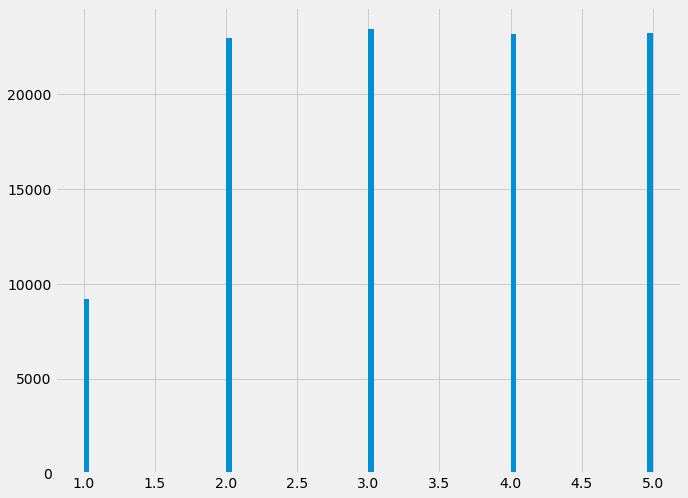

In [197]:
AirbnbData['rate'].hist(bins=100);

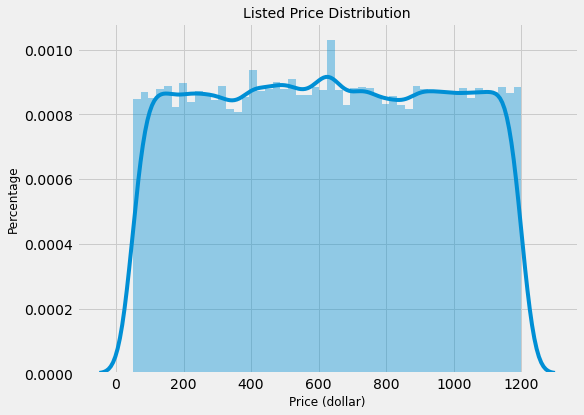

In [198]:
# visualizae the price
plt.figure(figsize=(8, 6))
sns.distplot(AirbnbData['price'], bins=50, kde=True)
plt.ylabel('Percentage', fontsize=12)
plt.xlabel('Price (dollar)', fontsize=12)
plt.title('Listed Price Distribution', fontsize=14);

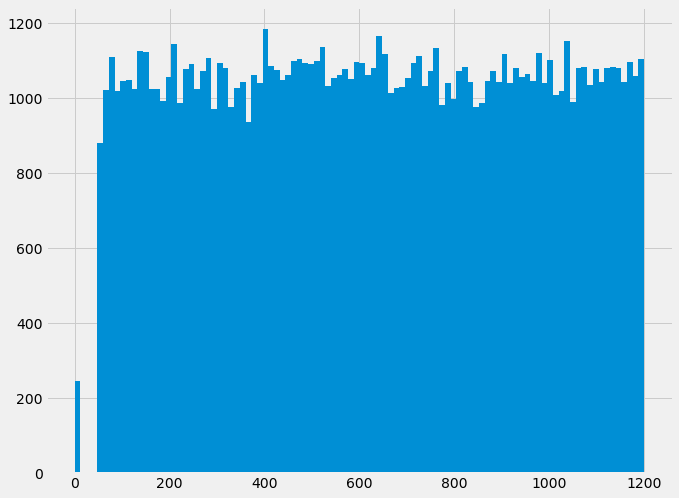

In [199]:
AirbnbData['service_fee'].hist(bins=100);

In [200]:
# Find outliers using z-scores

In [201]:
out=[]
outValues=[]

def find_ZScore_Outliers(df, columnName):
    dfOrig = df
    df = df[columnName]
    m = np.mean(df)
    s = np.std(df)
    
    for val in df:
        z = (val - m) / s
        if (np.abs(z) > 3):
            out.append(val)
            outValues.append((dfOrig.loc[dfOrig[columnName] == val]).index.values[0])
            
    print("Outliers:", out)
    print("Rows of outliers:", outValues)
    tmpRes = zip(outValues, out)

    print (list(tmpRes))
    

In [202]:
find_ZScore_Outliers(AirbnbData, 'number_of_reviews')

Outliers: [270.0, 430.0, 188.0, 198.0, 260.0, 242.0, 197.0, 273.0, 231.0, 214.0, 245.0, 248.0, 328.0, 289.0, 191.0, 338.0, 190.0, 194.0, 233.0, 335.0, 334.0, 467.0, 324.0, 354.0, 195.0, 260.0, 193.0, 426.0, 227.0, 240.0, 200.0, 234.0, 309.0, 219.0, 193.0, 213.0, 206.0, 199.0, 285.0, 358.0, 204.0, 253.0, 204.0, 192.0, 222.0, 205.0, 222.0, 458.0, 183.0, 189.0, 238.0, 193.0, 177.0, 185.0, 181.0, 333.0, 441.0, 248.0, 279.0, 227.0, 203.0, 210.0, 187.0, 214.0, 191.0, 198.0, 286.0, 398.0, 182.0, 240.0, 228.0, 388.0, 223.0, 218.0, 370.0, 380.0, 248.0, 247.0, 320.0, 225.0, 403.0, 263.0, 232.0, 191.0, 197.0, 414.0, 203.0, 385.0, 227.0, 205.0, 188.0, 480.0, 241.0, 271.0, 227.0, 187.0, 177.0, 179.0, 225.0, 401.0, 211.0, 295.0, 207.0, 273.0, 330.0, 258.0, 258.0, 228.0, 179.0, 234.0, 278.0, 235.0, 305.0, 242.0, 229.0, 181.0, 238.0, 241.0, 176.0, 178.0, 190.0, 216.0, 247.0, 233.0, 314.0, 244.0, 270.0, 203.0, 204.0, 208.0, 232.0, 238.0, 209.0, 236.0, 216.0, 207.0, 215.0, 320.0, 219.0, 297.0, 202.0, 26

In [203]:
AirbnbData.loc[outValues]

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day,house_quality,house_rate,total_price,house_price_value
3,1002755,None,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.69,-73.96,United States,US,True,moderate,Entire home/apt,"2,005.00",368.00,368.00,30.00,270.00,2019-07-05,4.64,4.00,322.00,No Smoking,2019,7,5,historic house,top rate,736.00,low price
8,1005754,Large Furnished Room Near B'way,79384379533,verified,Evelyn,Manhattan,Hell's Kitchen,40.76,-73.98,United States,US,True,strict,Private room,"2,005.00","1,018.00","1,018.00",2.00,430.00,2019-06-24,3.47,3.00,180.00,- Please clean up after yourself when using th...,2019,6,24,historic house,normal rate,"2,036.00",High Price
12,1007964,Central Manhattan/near Broadway,88136055909,verified,None,Manhattan,Hell's Kitchen,40.76,-73.99,United States,US,False,strict,Private room,"2,008.00",714.00,714.00,2.00,188.00,2019-06-23,1.50,4.00,258.00,- One of the bedroom closets is not accessible...,2019,6,23,historic house,top rate,"1,428.00",medium price
17,1010725,Perfect for Your Parents + Garden,80380130347,verified,Ryan,Brooklyn,Fort Greene,40.69,-73.97,United States,US,False,flexible,Entire home/apt,"2,006.00",656.00,656.00,2.00,198.00,2019-06-28,1.72,5.00,96.00,"- Please be mindful of the neighbors, quiet ti...",2019,6,28,historic house,top rate,"1,312.00",medium price
18,1011277,Chelsea Perfect,73862528370,verified,Alberta,Manhattan,Chelsea,40.74,-74.00,United States,US,False,moderate,Private room,"2,008.00",460.00,460.00,1.00,260.00,2019-07-01,2.12,3.00,325.00,No Smoking,2019,7,1,historic house,normal rate,920.00,medium price
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147,1082524,Retreat in Williamsburg,22731046418,verified,Abraham,Brooklyn,Williamsburg,40.71,-73.96,United States,US,True,strict,Entire home/apt,"2,007.00",625.36,0.00,4.00,240.00,2019-06-17,2.19,3.00,337.00,Leave shoes by door No strong scents (perfumes...,2019,6,17,historic house,normal rate,625.36,low price
527,1292398,Beautiful Grdn. Apt. in Park Slope,72815720692,verified,Cherry,Brooklyn,Park Slope,40.67,-73.98,United States,US,True,strict,Entire home/apt,"2,005.00",346.00,346.00,3.00,179.00,2019-05-29,2.02,5.00,114.00,No Smoking,2019,5,29,historic house,top rate,692.00,low price
1469,1812665,Prime location near Central Park !!,72421170786,verified,Olga,Manhattan,Upper East Side,40.78,-73.95,United States,US,False,strict,Private room,"2,021.00",302.00,302.00,1.00,347.00,2019-07-04,4.24,3.00,300.00,No Smoking,2019,7,4,Newly built,normal rate,604.00,low price
3077,2700763,Skylight BR in Gorgeous Rooftop Apt,94317530239,verified,Charisse,Brooklyn,Bushwick,40.69,-73.92,United States,US,True,moderate,Private room,"2,007.00","1,126.00","1,126.00",1.00,336.00,2019-06-28,4.83,4.00,95.00,No Smoking,2019,6,28,historic house,top rate,"2,252.00",High Price


In [204]:
out=[]
outValues=[]


def find_ZScore_Outliers_sigmaLevel(df, columnName, sigmaLevel):
    global out
    global outValues
    dfOrig = df
    df = df[columnName]
    m = np.mean(df)
    s = np.std(df)
    
    out = []
    outValues = []
    
    npdata = dfOrig[columnName].to_numpy()
    npindices = dfOrig[columnName].index.to_numpy()
    
    for i in range(len(npdata)):
        val = npdata[i]
        z = (val - m) / s
        if (np.abs(z) > sigmaLevel):
            out.append(val)
            outValues.append(npindices[i])
            
    print("Outliers:", out)
    print("Rows of outliers:", outValues)
    tmpRes = zip(outValues, out)

    print (list(tmpRes))
    

In [205]:
find_ZScore_Outliers_sigmaLevel(AirbnbData, 'number_of_reviews',3)

Outliers: [270.0, 430.0, 188.0, 198.0, 260.0, 242.0, 197.0, 273.0, 231.0, 214.0, 245.0, 248.0, 328.0, 289.0, 191.0, 338.0, 190.0, 194.0, 233.0, 335.0, 334.0, 467.0, 324.0, 354.0, 195.0, 260.0, 193.0, 426.0, 227.0, 240.0, 200.0, 234.0, 309.0, 219.0, 193.0, 213.0, 206.0, 199.0, 285.0, 358.0, 204.0, 253.0, 204.0, 192.0, 222.0, 205.0, 222.0, 458.0, 183.0, 189.0, 238.0, 193.0, 177.0, 185.0, 181.0, 333.0, 441.0, 248.0, 279.0, 227.0, 203.0, 210.0, 187.0, 214.0, 191.0, 198.0, 286.0, 398.0, 182.0, 240.0, 228.0, 388.0, 223.0, 218.0, 370.0, 380.0, 248.0, 247.0, 320.0, 225.0, 403.0, 263.0, 232.0, 191.0, 197.0, 414.0, 203.0, 385.0, 227.0, 205.0, 188.0, 480.0, 241.0, 271.0, 227.0, 187.0, 177.0, 179.0, 225.0, 401.0, 211.0, 295.0, 207.0, 273.0, 330.0, 258.0, 258.0, 228.0, 179.0, 234.0, 278.0, 235.0, 305.0, 242.0, 229.0, 181.0, 238.0, 241.0, 176.0, 178.0, 190.0, 216.0, 247.0, 233.0, 314.0, 244.0, 270.0, 203.0, 204.0, 208.0, 232.0, 238.0, 209.0, 236.0, 216.0, 207.0, 215.0, 320.0, 219.0, 297.0, 202.0, 26

In [206]:
AirbnbData.loc[outValues]

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day,house_quality,house_rate,total_price,house_price_value
3,1002755,None,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.69,-73.96,United States,US,True,moderate,Entire home/apt,"2,005.00",368.00,368.00,30.00,270.00,2019-07-05,4.64,4.00,322.00,No Smoking,2019,7,5,historic house,top rate,736.00,low price
8,1005754,Large Furnished Room Near B'way,79384379533,verified,Evelyn,Manhattan,Hell's Kitchen,40.76,-73.98,United States,US,True,strict,Private room,"2,005.00","1,018.00","1,018.00",2.00,430.00,2019-06-24,3.47,3.00,180.00,- Please clean up after yourself when using th...,2019,6,24,historic house,normal rate,"2,036.00",High Price
12,1007964,Central Manhattan/near Broadway,88136055909,verified,None,Manhattan,Hell's Kitchen,40.76,-73.99,United States,US,False,strict,Private room,"2,008.00",714.00,714.00,2.00,188.00,2019-06-23,1.50,4.00,258.00,- One of the bedroom closets is not accessible...,2019,6,23,historic house,top rate,"1,428.00",medium price
17,1010725,Perfect for Your Parents + Garden,80380130347,verified,Ryan,Brooklyn,Fort Greene,40.69,-73.97,United States,US,False,flexible,Entire home/apt,"2,006.00",656.00,656.00,2.00,198.00,2019-06-28,1.72,5.00,96.00,"- Please be mindful of the neighbors, quiet ti...",2019,6,28,historic house,top rate,"1,312.00",medium price
18,1011277,Chelsea Perfect,73862528370,verified,Alberta,Manhattan,Chelsea,40.74,-74.00,United States,US,False,moderate,Private room,"2,008.00",460.00,460.00,1.00,260.00,2019-07-01,2.12,3.00,325.00,No Smoking,2019,7,1,historic house,normal rate,920.00,medium price
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101647,57140974,Shay's Place #1\n( 1 Bdrm. Apt )\n5 mins From JFK,26299641873,unconfirmed,Sheila,Queens,Springfield Gardens,40.67,-73.76,United States,US,True,moderate,Entire home/apt,"2,009.00",80.00,80.00,1.00,240.00,2019-07-07,9.66,4.00,253.00,No Smoking,2019,7,7,historic house,top rate,160.00,cheep
101669,57153125,A Room with a View at The Funky Loft,36733759617,unconfirmed,Marcella & Saidat,Brooklyn,Bushwick,40.70,-73.92,United States,US,False,flexible,Private room,"2,018.00",611.00,611.00,3.00,179.00,2019-07-03,6.17,2.00,191.00,Dryer and Washing Machine are in Basement (1.0...,2019,7,3,Newly built,bad rate,"1,222.00",medium price
101967,57317710,Private bedroom 8 mins-JFK&The Mall,8468374547,verified,Yvonne,Queens,Jamaica,40.69,-73.79,United States,US,False,strict,Private room,"2,010.00",158.00,158.00,1.00,347.00,2019-07-06,13.48,1.00,159.00,Please be respectful of my things! I have a lo...,2019,7,6,Old House,bad rate,316.00,cheep
101990,57330413,"5 minutes from JFK,one single cozy bedroom for...",57075249279,verified,Kevin,Queens,Jamaica,40.68,-73.78,United States,US,True,flexible,Private room,"2,013.00",622.00,622.00,1.00,336.00,2019-07-05,11.91,3.00,345.00,No smoking in the bedroom. Smoking is allowed ...,2019,7,5,Old House,normal rate,"1,244.00",medium price


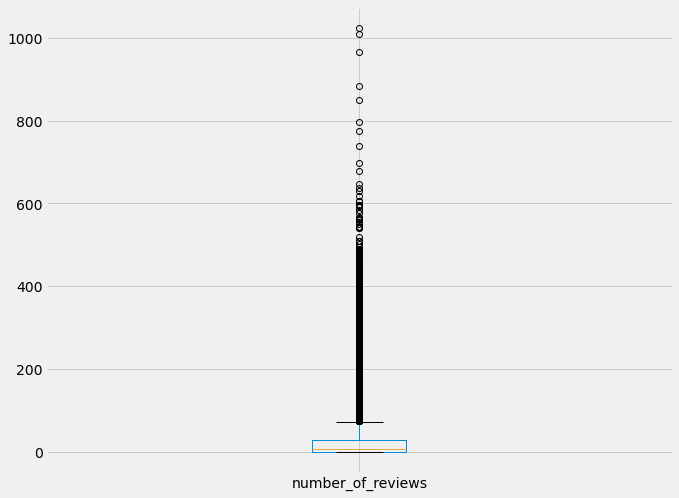

In [207]:
AirbnbData.boxplot(column=['number_of_reviews']);

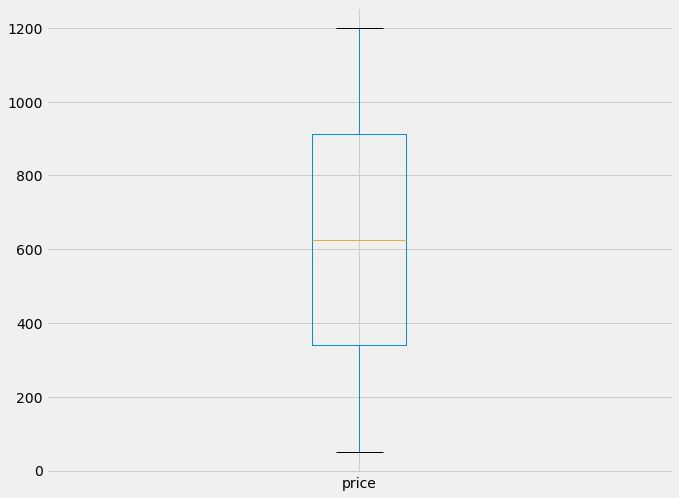

In [208]:
AirbnbData.boxplot(column=['price']);

In [209]:
def getlm(df):
    Y = df.price
    X = df[['number_of_reviews', 'reviews_per_month']]
    X = sm.add_constant(X)
    return sm.OLS(Y, X).fit()

In [210]:
lm = getlm(AirbnbData)
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.701
Date:                Fri, 03 Jun 2022   Prob (F-statistic):              0.183
Time:                        23:19:08   Log-Likelihood:            -7.3667e+05
No. Observations:              102005   AIC:                         1.473e+06
Df Residuals:                  102002   BIC:                         1.473e+06
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const               624.0158      1.272    490.622      0.000     621.523     626.509
number_of_reviews     0.0216      0.027      0.811      0.417      -0.031       0.074
reviews_per_month     0.6275      0.784      0.800      0.424      -0.910       2.165
==============================================================================
Omnibus:                    82536.575   Durbin-Watson:                   2.008
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6018.023
Skew:                           0.001   Prob(JB):                         0.00
Kurtosis:                       1.810   Cond. No.                         71.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

[Text(0.5, 0, 'number_of_reviews'),
 Text(0, 0.5, 'reviews_per_month'),
 Text(0.5, 1.0, 'AirbnbData')]

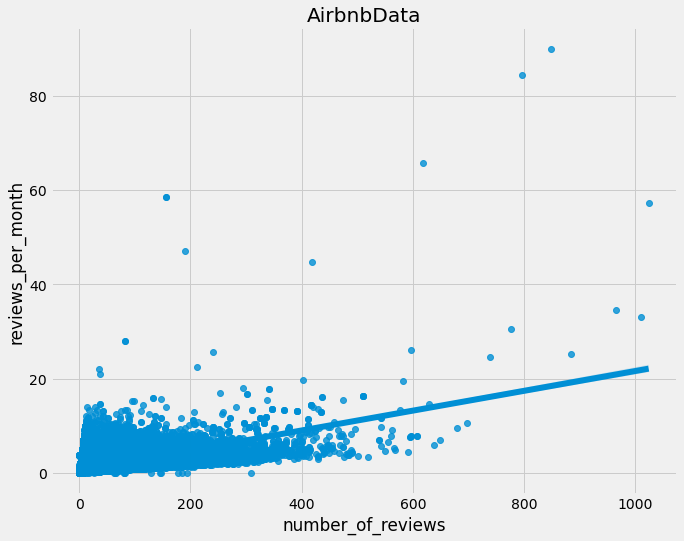

In [211]:
myPlotData = sns.regplot(x='number_of_reviews', y='reviews_per_month', data=AirbnbData)
myPlotData.set(xlabel="number_of_reviews", ylabel="reviews_per_month", title="AirbnbData")

In [212]:
AirbnbData.loc[(AirbnbData.number_of_reviews>600)]

,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day,house_quality,house_rate,total_price,house_price_value
2032,2123610,Great Bedroom in Manhattan,5145717894,unconfirmed,Jj,Manhattan,Harlem,40.82,-73.94,United States,US,False,strict,Private room,"2,013.00",394.00,394.00,1.00,607.00,2019-06-21,7.75,2.00,329.00,No Smoking,2019,6,21,Old House,bad rate,788.00,low price
11760,7496384,Room near JFK Queen Bed,58525948778,unconfirmed,Dona,Queens,Jamaica,40.67,-73.77,United States,US,True,moderate,Private room,"2,018.00",310.00,310.00,1.00,629.00,2019-07-05,14.58,2.00,334.00,House Rules 1. Check-in is 4 pm local time. If...,2019,7,5,Newly built,bad rate,620.00,low price
49605,28398178,Beautiful Standard Full Room at The Ridge,87332142446,unconfirmed,The Ridge,Manhattan,Lower East Side,40.72,-73.99,United States,US,False,strict,Private room,"2,018.00",74.00,74.00,1.00,776.00,2022-03-03,30.51,4.00,338.00,No Smoking,2022,3,3,Newly built,top rate,148.00,cheep
49653,28424688,Come catch a Broadway Show & stay in Times Square,20032806094,verified,M,Manhattan,Theater District,40.76,-73.98,United States,US,False,flexible,Private room,"2,008.00",89.00,89.00,1.00,849.00,2022-03-03,90.00,4.00,361.00,No Smoking,2022,3,3,historic house,top rate,178.00,cheep
49654,28425240,Short walk to Central Park/5th Ave/Radio City,39066649621,verified,M,Manhattan,Theater District,40.76,-73.98,United States,US,False,flexible,Private room,"2,008.00","1,051.00","1,051.00",1.00,618.00,2022-03-03,65.74,3.00,361.00,No Smoking,2022,3,3,historic house,normal rate,"2,102.00",High Price
49799,28505324,Amazing Micro Unit W/ communal rooftop and kit...,23813117370,verified,The Ridge,Manhattan,East Village,40.72,-73.99,United States,US,True,strict,Private room,"2,011.00",123.00,123.00,1.00,966.00,2022-03-02,34.46,2.00,355.00,No Smoking,2022,3,2,Old House,bad rate,246.00,cheep
49827,28520788,Hudson River View King Bed at Higher Floor,78564178478,unconfirmed,M,Manhattan,Theater District,40.76,-73.98,United States,US,False,moderate,Private room,"2,004.00",552.00,552.00,1.00,797.00,2022-03-02,84.49,4.00,361.00,No Smoking,2022,3,2,historic house,top rate,"1,104.00",medium price
49926,28575466,Williamsburg Penthouse Guestroom,2035884636,verified,Martin,Brooklyn,Williamsburg,40.71,-73.95,United States,US,False,strict,Private room,"2,019.00",281.00,281.00,1.00,648.00,2022-03-01,7.04,2.00,107.00,No Smoking,2022,3,1,Newly built,bad rate,562.00,low price
50715,29011231,Williamsburg Penthouse Hideaway,28338699286,unconfirmed,Martin,Brooklyn,Williamsburg,40.71,-73.95,United States,US,True,flexible,Private room,"2,013.00",758.00,758.00,1.00,638.00,2022-02-27,6.01,4.00,121.00,No Smoking,2022,2,27,Old House,top rate,"1,516.00",medium price
50780,29047130,THE PRIVACY DEN ~ 5 MINUTES TO JFK,12571850348,unconfirmed,Miss Dy,Queens,Jamaica,40.67,-73.77,United States,US,True,moderate,Entire home/apt,"2,005.00","1,147.00","1,147.00",1.00,698.00,2022-02-27,10.55,5.00,74.00,No Smoking,2022,2,27,historic house,top rate,"2,294.00",High Price


In [213]:
AirbnbData.loc[(AirbnbData.number_of_reviews > 600) & (AirbnbData.reviews_per_month > 20)]


,id,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day,house_quality,house_rate,total_price,house_price_value
49605,28398178,Beautiful Standard Full Room at The Ridge,87332142446,unconfirmed,The Ridge,Manhattan,Lower East Side,40.72,-73.99,United States,US,False,strict,Private room,"2,018.00",74.00,74.00,1.00,776.00,2022-03-03,30.51,4.00,338.00,No Smoking,2022,3,3,Newly built,top rate,148.00,cheep
49653,28424688,Come catch a Broadway Show & stay in Times Square,20032806094,verified,M,Manhattan,Theater District,40.76,-73.98,United States,US,False,flexible,Private room,"2,008.00",89.00,89.00,1.00,849.00,2022-03-03,90.00,4.00,361.00,No Smoking,2022,3,3,historic house,top rate,178.00,cheep
49654,28425240,Short walk to Central Park/5th Ave/Radio City,39066649621,verified,M,Manhattan,Theater District,40.76,-73.98,United States,US,False,flexible,Private room,"2,008.00","1,051.00","1,051.00",1.00,618.00,2022-03-03,65.74,3.00,361.00,No Smoking,2022,3,3,historic house,normal rate,"2,102.00",High Price
49799,28505324,Amazing Micro Unit W/ communal rooftop and kit...,23813117370,verified,The Ridge,Manhattan,East Village,40.72,-73.99,United States,US,True,strict,Private room,"2,011.00",123.00,123.00,1.00,966.00,2022-03-02,34.46,2.00,355.00,No Smoking,2022,3,2,Old House,bad rate,246.00,cheep
49827,28520788,Hudson River View King Bed at Higher Floor,78564178478,unconfirmed,M,Manhattan,Theater District,40.76,-73.98,United States,US,False,moderate,Private room,"2,004.00",552.00,552.00,1.00,797.00,2022-03-02,84.49,4.00,361.00,No Smoking,2022,3,2,historic house,top rate,"1,104.00",medium price
52488,29990458,Sonder Battery Park | Studio Apartment,53558555483,verified,Sonder (NYC),Manhattan,Financial District,40.71,-74.01,United States,US,False,strict,Entire home/apt,"2,019.00",121.00,121.00,2.00,"1,024.00",2022-02-21,57.31,4.00,365.00,No Smoking,2022,2,21,Newly built,top rate,242.00,cheep
53078,30316315,Enjoy great views of the City!,41031720514,unconfirmed,Row NYC,Manhattan,Theater District,40.76,-73.99,United States,US,False,flexible,Hotel room,"2,004.00",486.00,486.00,1.00,884.00,2022-02-19,25.23,3.00,360.00,No Smoking,2022,2,19,historic house,normal rate,972.00,medium price
57532,32776260,King Room City,90212124971,verified,Arlo NoMad,Manhattan,Midtown,40.75,-73.98,United States,US,True,strict,Hotel room,"2,012.00",257.00,257.00,1.00,738.00,2022-01-10,24.49,3.00,118.00,No Smoking,2022,1,10,Old House,normal rate,514.00,low price
62244,35378697,City King,44069230937,verified,Arlo SoHo,Manhattan,SoHo,40.72,-74.01,United States,US,False,moderate,Hotel room,"2,017.00","1,097.00","1,097.00",1.00,"1,010.00",2021-11-22,33.08,4.00,80.00,No Smoking,2021,11,22,Old House,top rate,"2,194.00",High Price


In [214]:
from pyod.models.knn import KNN
from sklearn.preprocessing import StandardScaler

In [215]:
# create a standardized dataset of the analysis variables

standardizer = StandardScaler()
analysisvars = ['number_of_reviews','total_price']
analysis = AirbnbData.loc[:, analysisvars].dropna()
analysisStandard = standardizer.fit_transform(analysis.iloc[:, :])

In [216]:
# run the KNN model and generate anomaly scores
clf_name = 'KNN'
clf = KNN(contamination=0.1)
clf.fit(analysisStandard)
y_pred = clf.labels_
y_scores = clf.decision_scores_

KNN(algorithm='auto', contamination=0.1, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=1, n_neighbors=5, p=2,
  radius=1.0)

In [217]:
# show the predictions from the model
pred = pd.DataFrame(zip(y_pred, y_scores), 
  columns=['outlier','scores'], 
  index=analysis.index)
pred.sample(20)
pred.outlier.value_counts()
pred.groupby(['outlier'])[['scores']].agg(['min','median','max'])

,outlier,scores
66654,0,0.01
52251,0,0.02
61988,0,0.01
78775,0,0.01
82802,0,0.00
83820,0,0.01
65486,0,0.00
8039,1,0.13
78300,0,0.02
81699,0,0.02


0    91876
1    10129
Name: outlier, dtype: int64

scores            
           min median  max
outlier                   
0         0.00   0.00 0.02
1         0.02   0.04 4.77

In [218]:
KNNFrame = analysis.join(pred).loc[pred.outlier==1,['number_of_reviews','total_price']].\
  sort_values(['number_of_reviews'], ascending=False)

In [219]:
KNNFrame

,number_of_reviews,total_price
52488,"1,024.00",242.00
62244,"1,010.00","2,194.00"
49799,966.00,246.00
53078,884.00,972.00
49653,849.00,178.00
...,...,...
690,25.00,"1,556.00"
62393,25.00,"1,566.00"
54516,23.00,384.00
62542,22.00,384.00


In [220]:
# Lets use some chart

In [221]:
AirbnbData.columns.to_list()

['id',
 'listing_name',
 'host_id',
 'host_identity_verified',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'country',
 'country_code',
 'instant_bookable',
 'cancellation_policy',
 'room_type',
 'construction_year',
 'price',
 'service_fee',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'rate',
 'availability_365',
 'house_rules',
 'year',
 'month',
 'day',
 'house_quality',
 'house_rate',
 'total_price',
 'house_price_value']

In [222]:
print(AirbnbData.id.count())
print(AirbnbData.id.nunique())

102005
102005


In [223]:
AirbnbData.set_index("id", inplace=True)

In [224]:
AirbnbData.dtypes

listing_name                      object
host_id                            int64
host_identity_verified          category
host_name                         object
neighbourhood_group             category
neighbourhood                   category
latitude                         float64
longitude                        float64
country                           object
country_code                      object
instant_bookable                category
cancellation_policy             category
room_type                       category
construction_year                float64
price                            float64
service_fee                      float64
minimum_nights                   float64
number_of_reviews                float64
last_review               datetime64[ns]
reviews_per_month                float64
rate                             float64
availability_365                 float64
house_rules                       object
year                               Int64
month           

In [225]:
# count of each category
AirbnbData['neighbourhood_group'].value_counts()

Manhattan        43546
Brooklyn         41620
Queens           13196
Bronx             2694
Staten Island      949
Name: neighbourhood_group, dtype: int64

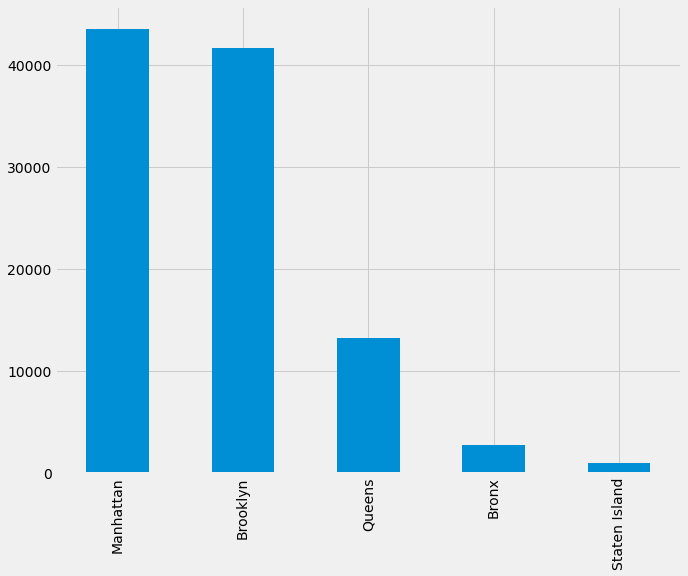

In [226]:
# plot a bar plot from value counts
AirbnbData['neighbourhood_group'].value_counts().plot.bar();

<Figure size 720x504 with 0 Axes>

<AxesSubplot:>

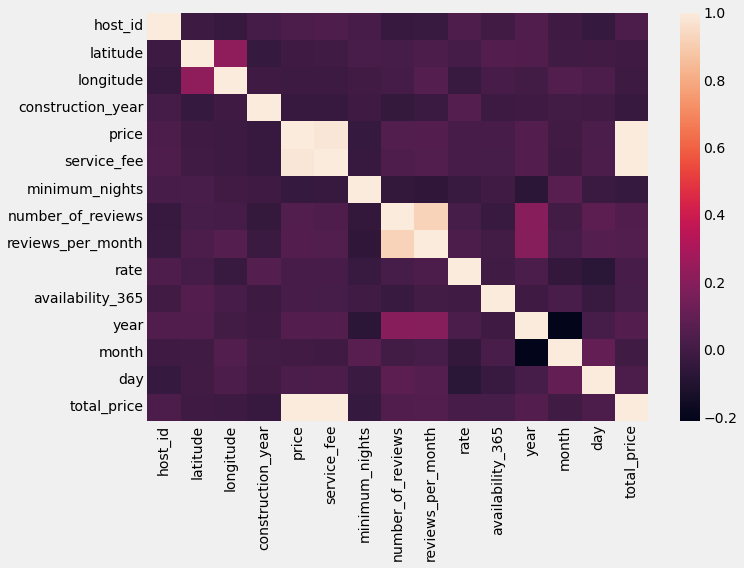

In [227]:
import seaborn as sns
plt.figure(figsize=(10,7))
sns.heatmap(AirbnbData[1:1000].corr())

<Figure size 720x504 with 0 Axes>

<AxesSubplot:>

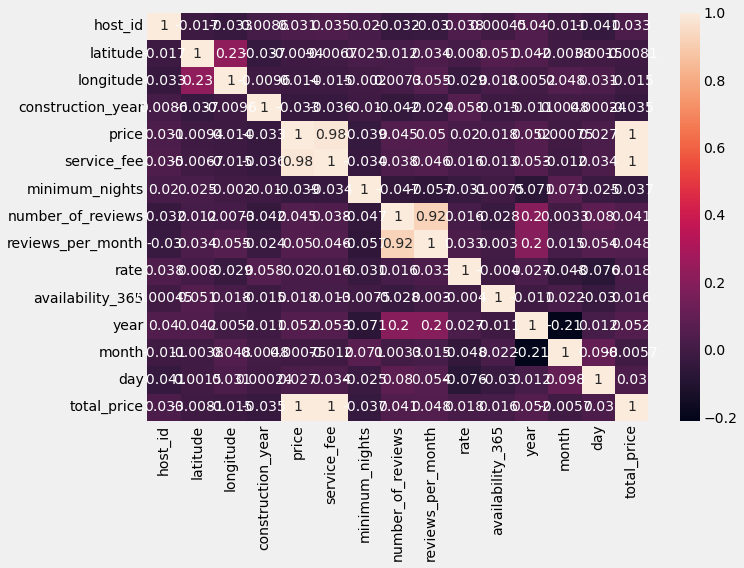

In [228]:
plt.figure(figsize=(10,7))
sns.heatmap(AirbnbData[1:1000].corr(), annot = True)

Text(0.5, 1.0, 'Histogram of prices (total)')

<AxesSubplot:title={'center':'Histogram of prices (total)'}, xlabel='total_price', ylabel='Density'>

Text(0.5, 0.98, 'Distribution of prices')

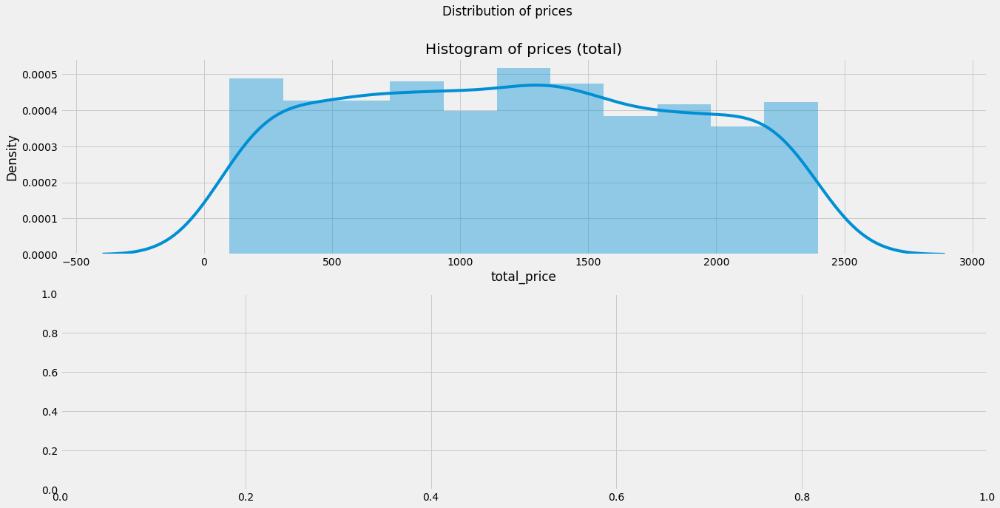

In [229]:
fig, ax= plt.subplots(2, figsize=(20,10))

ax[0].set_title("Histogram of prices (total)")
sns.distplot(AirbnbData.total_price[1:1000], kde=True, ax=ax[0])

fig.suptitle("Distribution of prices")
fig.show()

<AxesSubplot:>

[Text(0, 0, 'New Dorp'),
 Text(1, 0, 'Chelsea, Staten Island'),
 Text(2, 0, 'Fort Wadsworth'),
 Text(3, 0, 'Little Neck'),
 Text(4, 0, 'Jamaica Hills'),
 Text(5, 0, 'Shore Acres'),
 Text(6, 0, 'Arden Heights'),
 Text(7, 0, 'Midland Beach'),
 Text(8, 0, 'Mill Basin'),
 Text(9, 0, 'Riverdale'),
 Text(10, 0, 'East Morrisania'),
 Text(11, 0, 'Morris Heights'),
 Text(12, 0, 'Pelham Bay'),
 Text(13, 0, 'North Riverdale'),
 Text(14, 0, 'Graniteville'),
 Text(15, 0, 'Bath Beach'),
 Text(16, 0, 'Columbia St'),
 Text(17, 0, 'Eltingville'),
 Text(18, 0, 'Woodrow'),
 Text(19, 0, 'Todt Hill')]

Text(0.5, 1.0, 'Top 20 most expensive neighbourhoods')

<AxesSubplot:>

Text(0.5, 1.0, 'Mean price of each neighbourhoods group')

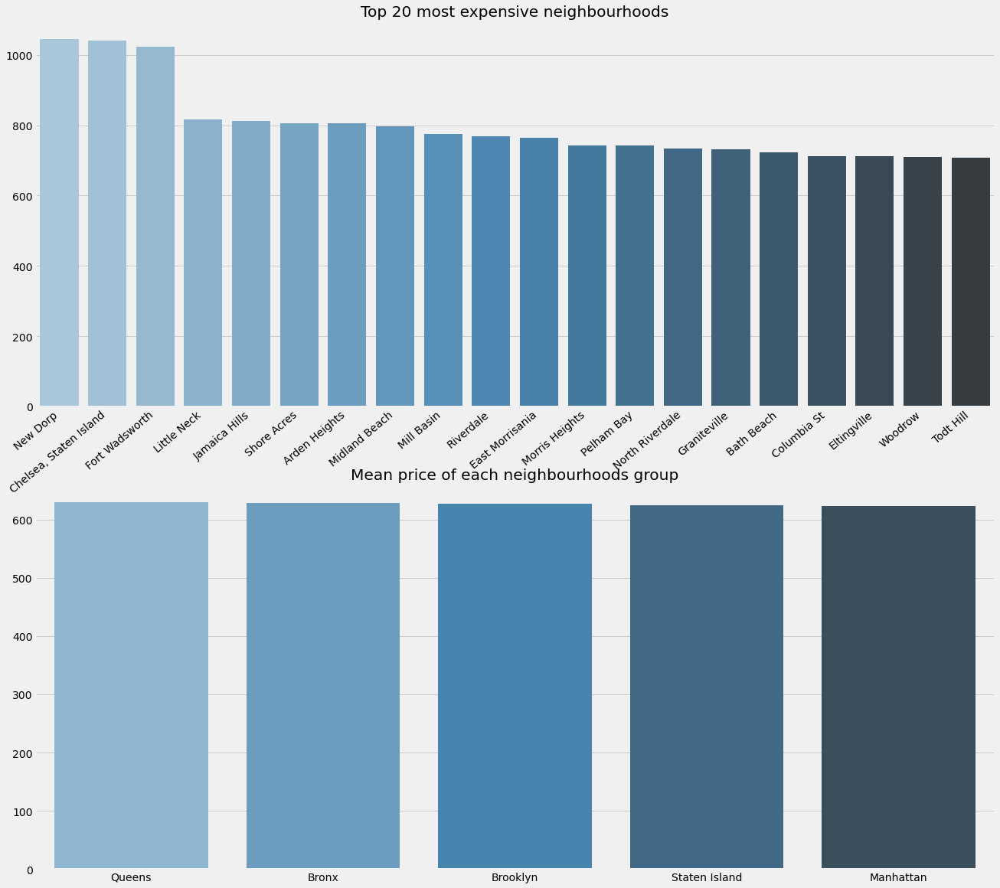

In [230]:
d = AirbnbData.groupby('neighbourhood')['price'].mean().sort_values(ascending=False)

fig, ax= plt.subplots(2,1, figsize=(20,19))
sns.barplot(d.index.tolist()[:20], d.values[:20], ax=ax[0], palette=("Blues_d"))
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=40, ha="right")
ax[0].set_title('Top 20 most expensive neighbourhoods')

d = AirbnbData.groupby('neighbourhood_group')['price'].mean().sort_values(ascending=False)[:5]
sns.barplot(d.index.tolist(), d.values, ax=ax[1], palette=("Blues_d"))
#ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=40, ha="right")
ax[1].set_title('Mean price of each neighbourhoods group')

fig.show()

In [231]:
AirbnbDataCross1 = pd.qcut(AirbnbData['number_of_reviews'],
                                          labels = ['very low', 'low', 'medium', 'high', 'very high']
                                          , q = 5
                                          , precision=0)

In [232]:
AirbnbDataCross2 = pd.qcut(AirbnbData['reviews_per_month'],
                                          labels = ['very low', 'low', 'medium', 'high', 'very high']
                                          , q = 5
                                          , precision=0)

In [233]:
pd.crosstab(AirbnbDataCross1, AirbnbDataCross2)

reviews_per_month,very low,low,medium,high,very high
number_of_reviews,,,,,
very low,20020,3181,1588,1401,8
low,1396,9020,3440,2105,632
medium,10,6649,7227,3357,2360
high,3,772,6967,6823,5016
very high,13,0,1078,6625,12314


## Folium 
is a powerful Python library that helps you create several types of Leaflet maps. By default, Folium creates a map in a separate HTML file. Since Folium results are interactive, this library is very useful for dashboard building. You can also create inline Jupyter maps in Folium.


In [234]:
map = folium.Map([40.7128,-74.0060],zoom_start=11)
folium.plugins.HeatMap(AirbnbData[['latitude','longitude']].dropna(),
                       radius=8, gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(map)
display(map)

<AxesSubplot:>

Text(0.5, 1.0, 'Average price of room types')

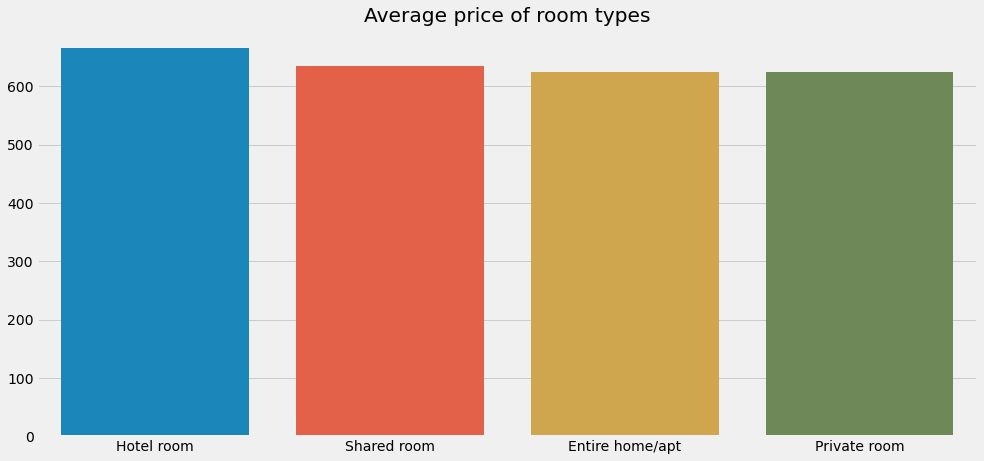

In [235]:
d = AirbnbData.groupby('room_type')['price'].mean().sort_values(ascending=False)
fig, ax= plt.subplots(figsize=(15,7))
sns.barplot(d.index.tolist(), d.values, ax=ax)
ax.set_title('Average price of room types')
fig.show()

In [236]:
px.scatter(AirbnbData[AirbnbData['total_price']>1500], x="reviews_per_month", y='total_price', color='room_type', title='Popularity/Price')

<AxesSubplot:xlabel='minimum_nights', ylabel='Density'>

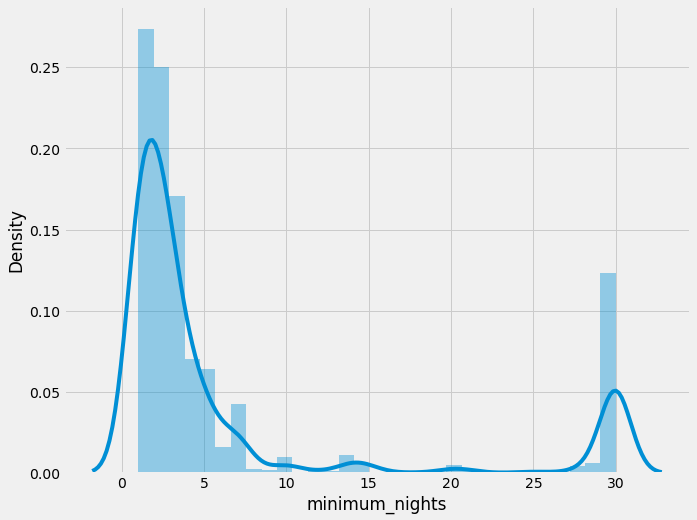

In [237]:
sns.distplot(AirbnbData[(AirbnbData['minimum_nights'] <= 30) & (AirbnbData['minimum_nights'] > 0)]['minimum_nights'], bins=31)


In [238]:
AirbnbData.columns.to_list()

['listing_name',
 'host_id',
 'host_identity_verified',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'country',
 'country_code',
 'instant_bookable',
 'cancellation_policy',
 'room_type',
 'construction_year',
 'price',
 'service_fee',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'rate',
 'availability_365',
 'house_rules',
 'year',
 'month',
 'day',
 'house_quality',
 'house_rate',
 'total_price',
 'house_price_value']

In [239]:
AirbnbData.groupby(['neighbourhood'])['reviews_per_month'].count()

neighbourhood
Allerton             96
Arden Heights         9
Arrochar             51
Arverne             219
Astoria            1868
                   ... 
Windsor Terrace     331
Woodhaven           190
Woodlawn             29
Woodrow               3
Woodside            584
Name: reviews_per_month, Length: 224, dtype: int64

In [240]:
reviews_neighbours = AirbnbData.groupby(['neighbourhood_group'])['reviews_per_month'].count().sort_values(ascending=False)

<Figure size 720x504 with 0 Axes>

<AxesSubplot:ylabel='neighbourhood_group'>

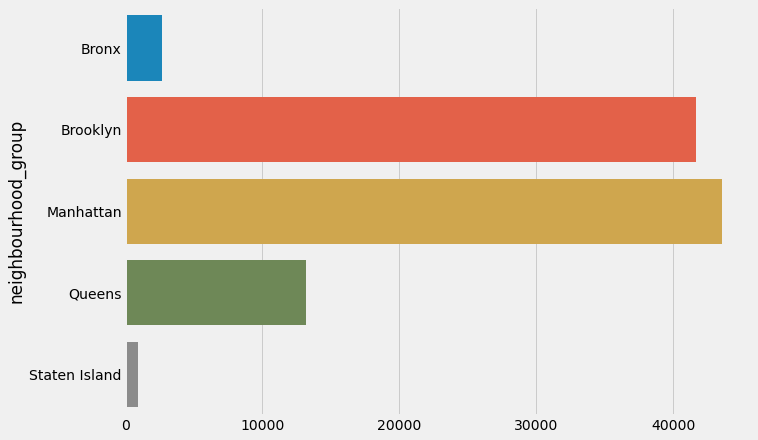

In [241]:
plt.figure(figsize=(10,7))
sns.barplot(reviews_neighbours.values,reviews_neighbours.index)

In [242]:
AirbnbData.groupby(['neighbourhood'])['price'].mean().sort_values(ascending=False)

neighbourhood
New Dorp                 1,045.00
Chelsea, Staten Island   1,042.00
Fort Wadsworth           1,024.00
Little Neck                817.75
Jamaica Hills              812.90
                           ...   
Richmondtown               373.40
Breezy Point               309.89
Rossville                  300.67
Spuyten Duyvil             293.44
Lighthouse Hill            107.67
Name: price, Length: 224, dtype: float64

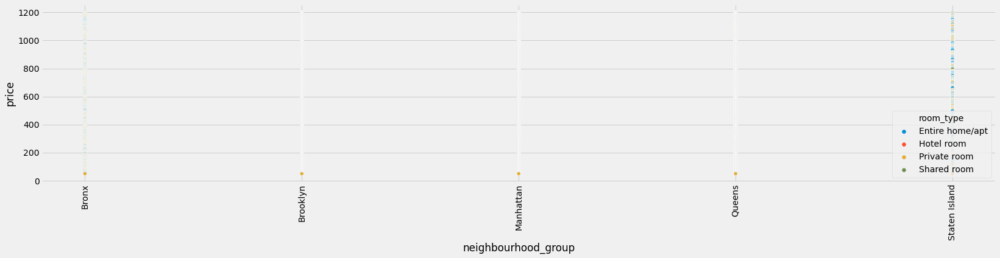

In [243]:
plt.figure(figsize=(25,5))
sns.scatterplot(x='neighbourhood_group',y='price',data=AirbnbData.sort_values('price',ascending=False),hue='room_type')
plt.xticks(rotation=90);

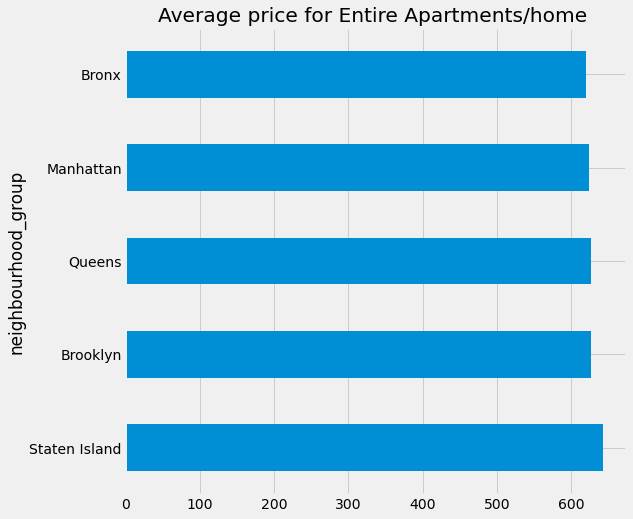

In [244]:
plt.figure(figsize=(8,8))
AirbnbData[AirbnbData['room_type']=='Entire home/apt'].groupby(['neighbourhood_group'])['price'].mean().sort_values(ascending=False).plot(kind='barh')
plt.title('Average price for Entire Apartments/home ');

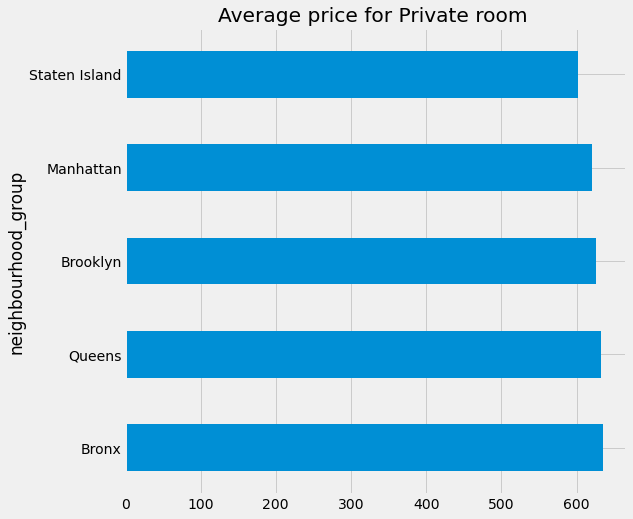

In [245]:
plt.figure(figsize=(8,8))
AirbnbData[AirbnbData['room_type']=='Private room'].groupby(['neighbourhood_group'])['price'].mean().sort_values(ascending=False).plot(kind='barh')
plt.title('Average price for Private room ');

## Top 10 part :)

In [246]:
NeighbourGroup = AirbnbData.groupby('neighbourhood_group')
type(NeighbourGroup)

pandas.core.groupby.generic.DataFrameGroupBy

In [247]:
NeighbourGroup.size()

neighbourhood_group
Bronx             2694
Brooklyn         41620
Manhattan        43546
Queens           13196
Staten Island      949
dtype: int64

In [248]:
NeighbourGroup.size().nlargest(10)


neighbourhood_group
Manhattan        43546
Brooklyn         41620
Queens           13196
Bronx             2694
Staten Island      949
dtype: int64

In [249]:
HoodGroup = AirbnbData.groupby('neighbourhood')
type(HoodGroup)

pandas.core.groupby.generic.DataFrameGroupBy

In [250]:
HoodGroup.size()

neighbourhood
Allerton             96
Arden Heights         9
Arrochar             51
Arverne             219
Astoria            1868
                   ... 
Windsor Terrace     331
Woodhaven           190
Woodlawn             29
Woodrow               3
Woodside            584
Length: 224, dtype: int64

In [251]:
HoodGroup.size().nlargest(10)


neighbourhood
Bedford-Stuyvesant    7897
Williamsburg          7727
Harlem                5438
Bushwick              4953
Hell's Kitchen        3949
Upper West Side       3839
Upper East Side       3655
East Village          3473
Midtown               3357
Crown Heights         3250
dtype: int64

In [252]:
HousePriceGroup = AirbnbData.groupby('total_price')


In [253]:
HousePriceGroup.size()

total_price
100.00       93
102.00       86
104.00       86
106.00       65
108.00       66
           ... 
2,392.00     78
2,394.00     79
2,396.00     77
2,398.00    102
2,400.00     68
Length: 1152, dtype: int64

In [254]:
HousePriceGroup.size().nlargest(10)


total_price
625.36      245
412.00      135
2,112.00    131
962.00      129
1,666.00    127
1,146.00    126
1,944.00    125
276.00      122
860.00      120
566.00      119
dtype: int64

In [255]:
plt.style.use('ggplot')

In [256]:
top10rating = AirbnbData.sort_values('total_price', ascending=False).head(10)

Text(0.5, 0, 'Total Price')

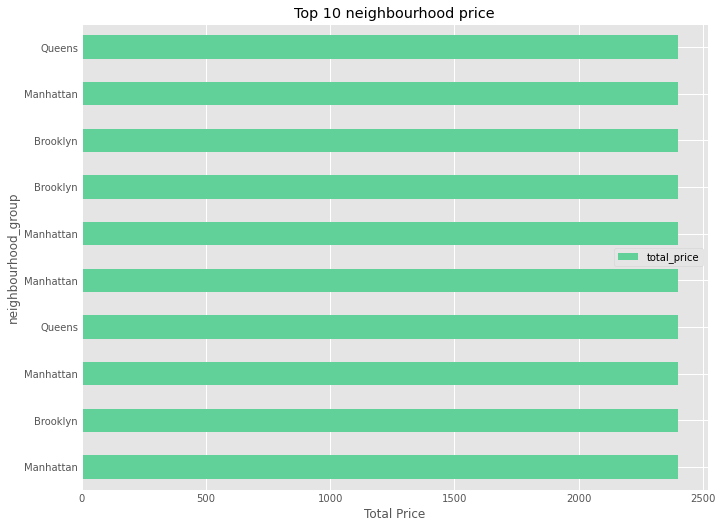

In [257]:
ax = top10rating.plot(kind='barh', x='neighbourhood_group', y='total_price', color='#61D199',
title='Top 10 neighbourhood price')
ax.set_xlabel("Total Price") 

Text(0.5, 0, 'rate')

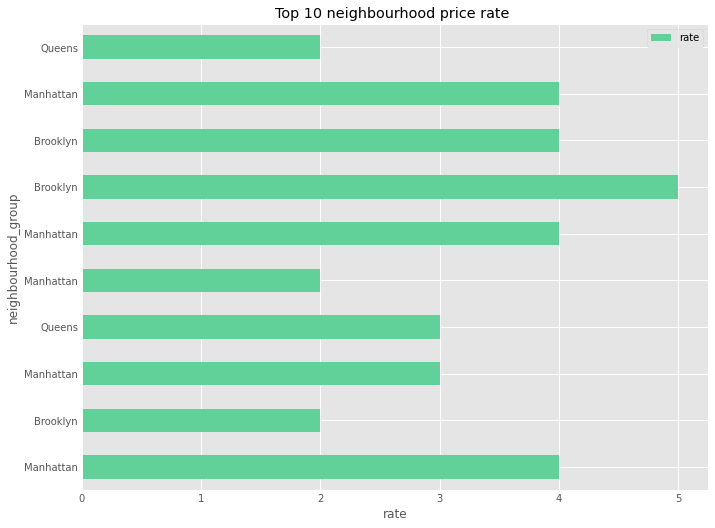

In [258]:
ax = top10rating.plot(kind='barh', x='neighbourhood_group', y='rate', color='#61D199',
title='Top 10 neighbourhood price rate ')
ax.set_xlabel("rate") 

Text(0.5, 0, 'availability')

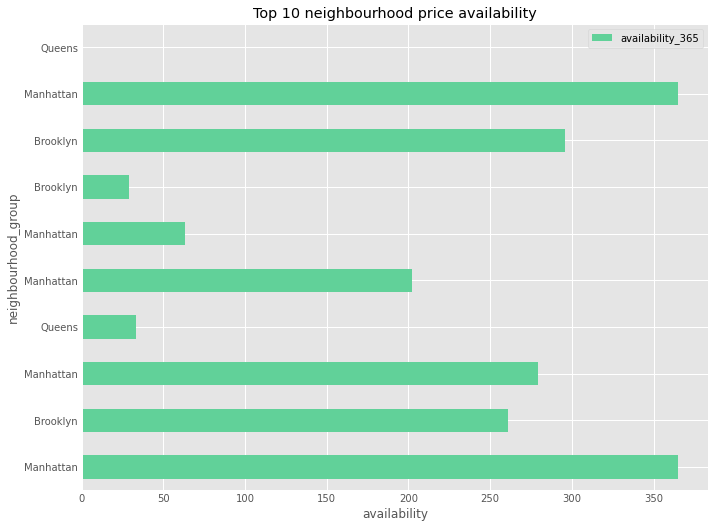

In [259]:
ax = top10rating.plot(kind='barh', x='neighbourhood_group', y='availability_365', color='#61D199',
title='Top 10 neighbourhood price availability')
ax.set_xlabel("availability") 

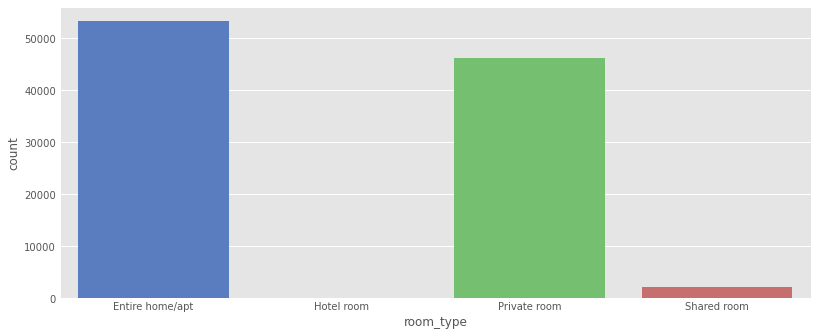

In [260]:
f,ax = plt.subplots(figsize=(12,5))
ax = sns.countplot(AirbnbData.room_type,palette="muted")
plt.show()

In [261]:
top_reviewed_listings=AirbnbData.nlargest(10,'number_of_reviews')
top_reviewed_listings

,listing_name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,latitude,longitude,country,country_code,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,rate,availability_365,house_rules,year,month,day,house_quality,house_rate,total_price,house_price_value
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
29990458,Sonder Battery Park | Studio Apartment,53558555483,verified,Sonder (NYC),Manhattan,Financial District,40.71,-74.01,United States,US,False,strict,Entire home/apt,"2,019.00",121.00,121.00,2.00,"1,024.00",2022-02-21,57.31,4.00,365.00,No Smoking,2022,2,21,Newly built,top rate,242.00,cheep
35378697,City King,44069230937,verified,Arlo SoHo,Manhattan,SoHo,40.72,-74.01,United States,US,False,moderate,Hotel room,"2,017.00","1,097.00","1,097.00",1.00,"1,010.00",2021-11-22,33.08,4.00,80.00,No Smoking,2021,11,22,Old House,top rate,"2,194.00",High Price
28505324,Amazing Micro Unit W/ communal rooftop and kit...,23813117370,verified,The Ridge,Manhattan,East Village,40.72,-73.99,United States,US,True,strict,Private room,"2,011.00",123.00,123.00,1.00,966.00,2022-03-02,34.46,2.00,355.00,No Smoking,2022,3,2,Old House,bad rate,246.00,cheep
30316315,Enjoy great views of the City!,41031720514,unconfirmed,Row NYC,Manhattan,Theater District,40.76,-73.99,United States,US,False,flexible,Hotel room,"2,004.00",486.00,486.00,1.00,884.00,2022-02-19,25.23,3.00,360.00,No Smoking,2022,2,19,historic house,normal rate,972.00,medium price
28424688,Come catch a Broadway Show & stay in Times Square,20032806094,verified,M,Manhattan,Theater District,40.76,-73.98,United States,US,False,flexible,Private room,"2,008.00",89.00,89.00,1.00,849.00,2022-03-03,90.00,4.00,361.00,No Smoking,2022,3,3,historic house,top rate,178.00,cheep
28520788,Hudson River View King Bed at Higher Floor,78564178478,unconfirmed,M,Manhattan,Theater District,40.76,-73.98,United States,US,False,moderate,Private room,"2,004.00",552.00,552.00,1.00,797.00,2022-03-02,84.49,4.00,361.00,No Smoking,2022,3,2,historic house,top rate,"1,104.00",medium price
28398178,Beautiful Standard Full Room at The Ridge,87332142446,unconfirmed,The Ridge,Manhattan,Lower East Side,40.72,-73.99,United States,US,False,strict,Private room,"2,018.00",74.00,74.00,1.00,776.00,2022-03-03,30.51,4.00,338.00,No Smoking,2022,3,3,Newly built,top rate,148.00,cheep
32776260,King Room City,90212124971,verified,Arlo NoMad,Manhattan,Midtown,40.75,-73.98,United States,US,True,strict,Hotel room,"2,012.00",257.00,257.00,1.00,738.00,2022-01-10,24.49,3.00,118.00,No Smoking,2022,1,10,Old House,normal rate,514.00,low price
29047130,THE PRIVACY DEN ~ 5 MINUTES TO JFK,12571850348,unconfirmed,Miss Dy,Queens,Jamaica,40.67,-73.77,United States,US,True,moderate,Entire home/apt,"2,005.00","1,147.00","1,147.00",1.00,698.00,2022-02-27,10.55,5.00,74.00,No Smoking,2022,2,27,historic house,top rate,"2,294.00",High Price


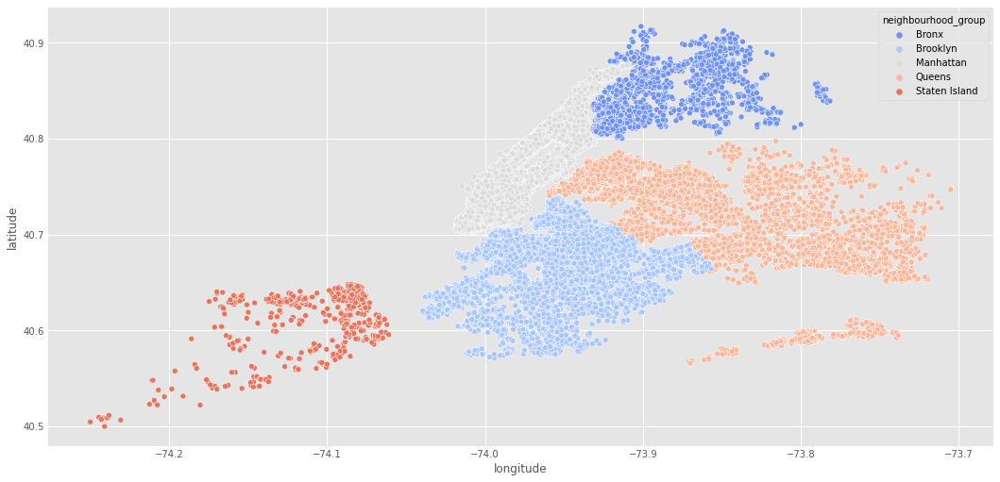

In [262]:
f,ax = plt.subplots(figsize=(16,8))
ax = sns.scatterplot(y=AirbnbData.latitude,x=AirbnbData.longitude,hue=AirbnbData.neighbourhood_group,palette="coolwarm")
plt.show()

<AxesSubplot:xlabel='room_type', ylabel='count'>

Text(0.5, 1.0, 'room_typet')

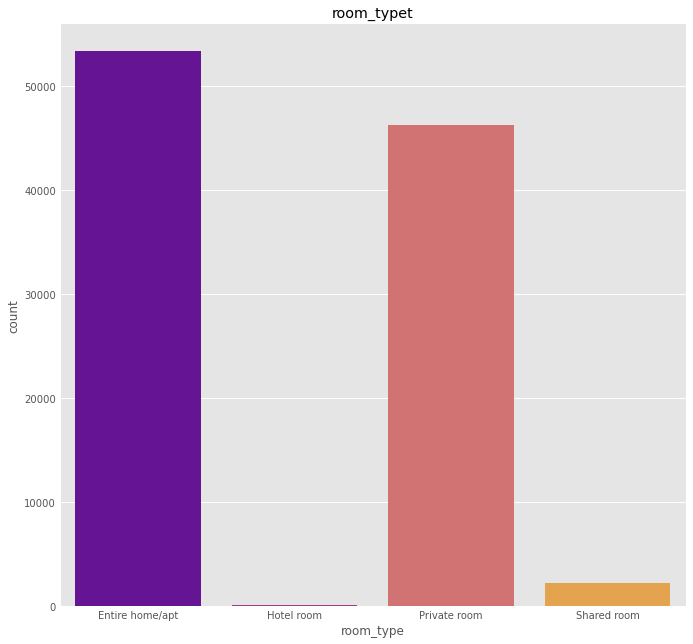

In [263]:
sns.countplot(AirbnbData['room_type'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('room_typet')

<AxesSubplot:ylabel='neighbourhood_group'>

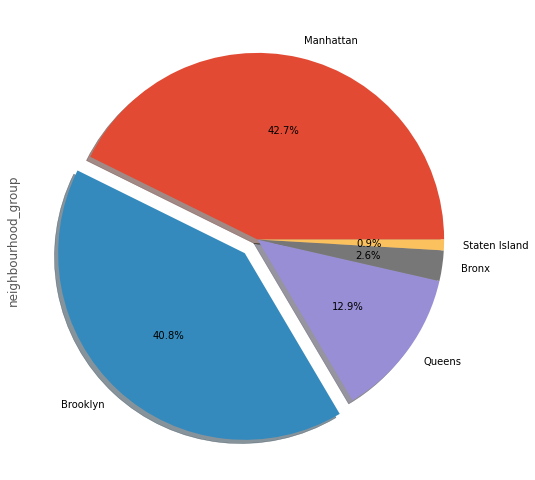

In [264]:
AirbnbData['neighbourhood_group'].value_counts().plot.pie(explode=[0,0.1,0,0,0],autopct='%1.1f%%',shadow=True)

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='room_type', ylabel='count'>

Text(0.5, 1.0, 'Room types occupied by the neighbourhood_group')

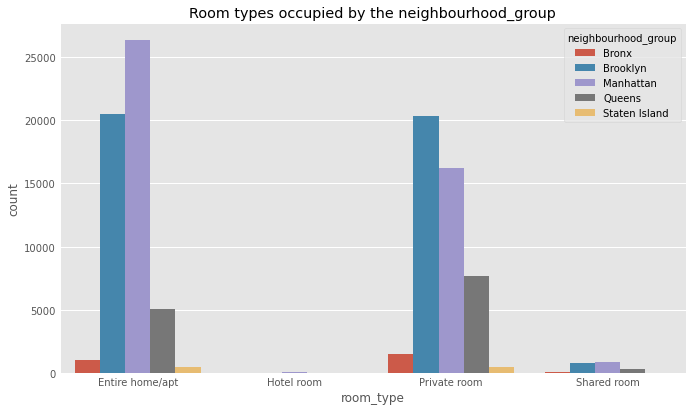

In [265]:
plt.figure(figsize=(10,6))
sns.countplot(x = 'room_type',hue = "neighbourhood_group",data = AirbnbData)
plt.title("Room types occupied by the neighbourhood_group")
plt.show()

array([[<AxesSubplot:title={'center':'host_id'}>,
        <AxesSubplot:title={'center':'latitude'}>,
        <AxesSubplot:title={'center':'longitude'}>,
        <AxesSubplot:title={'center':'construction_year'}>],
       [<AxesSubplot:title={'center':'price'}>,
        <AxesSubplot:title={'center':'service_fee'}>,
        <AxesSubplot:title={'center':'minimum_nights'}>,
        <AxesSubplot:title={'center':'number_of_reviews'}>],
       [<AxesSubplot:title={'center':'last_review'}>,
        <AxesSubplot:title={'center':'reviews_per_month'}>,
        <AxesSubplot:title={'center':'rate'}>,
        <AxesSubplot:title={'center':'availability_365'}>],
       [<AxesSubplot:title={'center':'year'}>,
        <AxesSubplot:title={'center':'month'}>,
        <AxesSubplot:title={'center':'day'}>,
        <AxesSubplot:title={'center':'total_price'}>]], dtype=object)

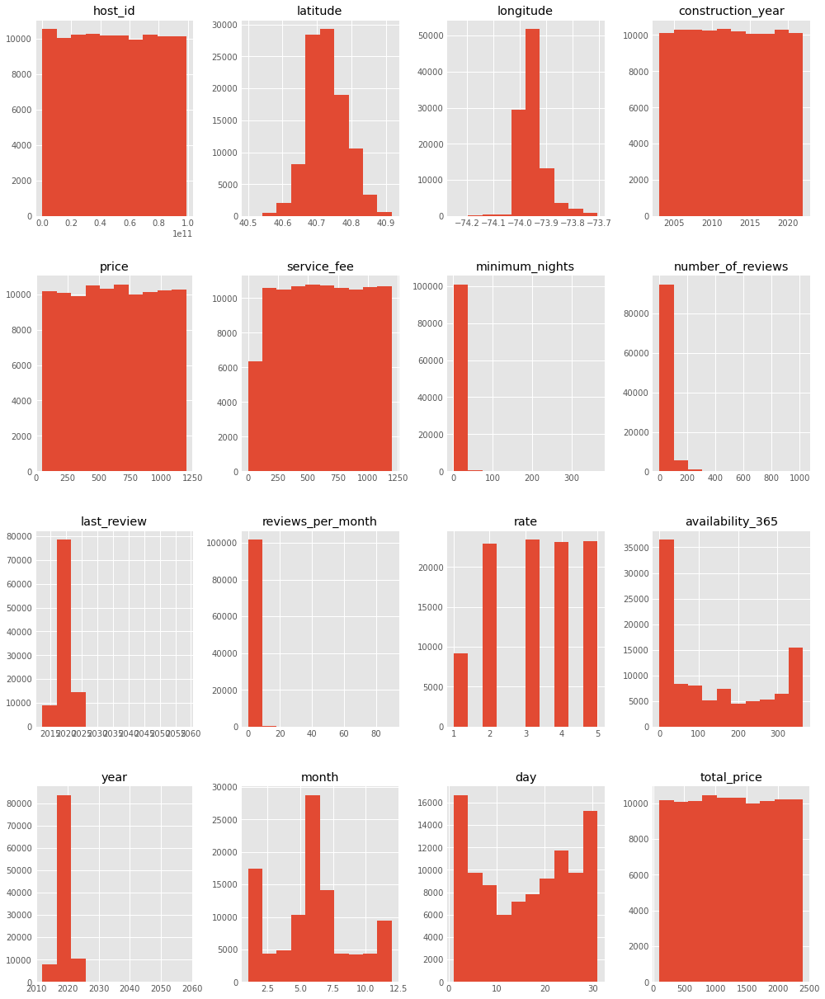

In [266]:
fig = plt.figure(figsize = (15,20))
ax = fig.gca()
AirbnbData.hist(ax = ax)

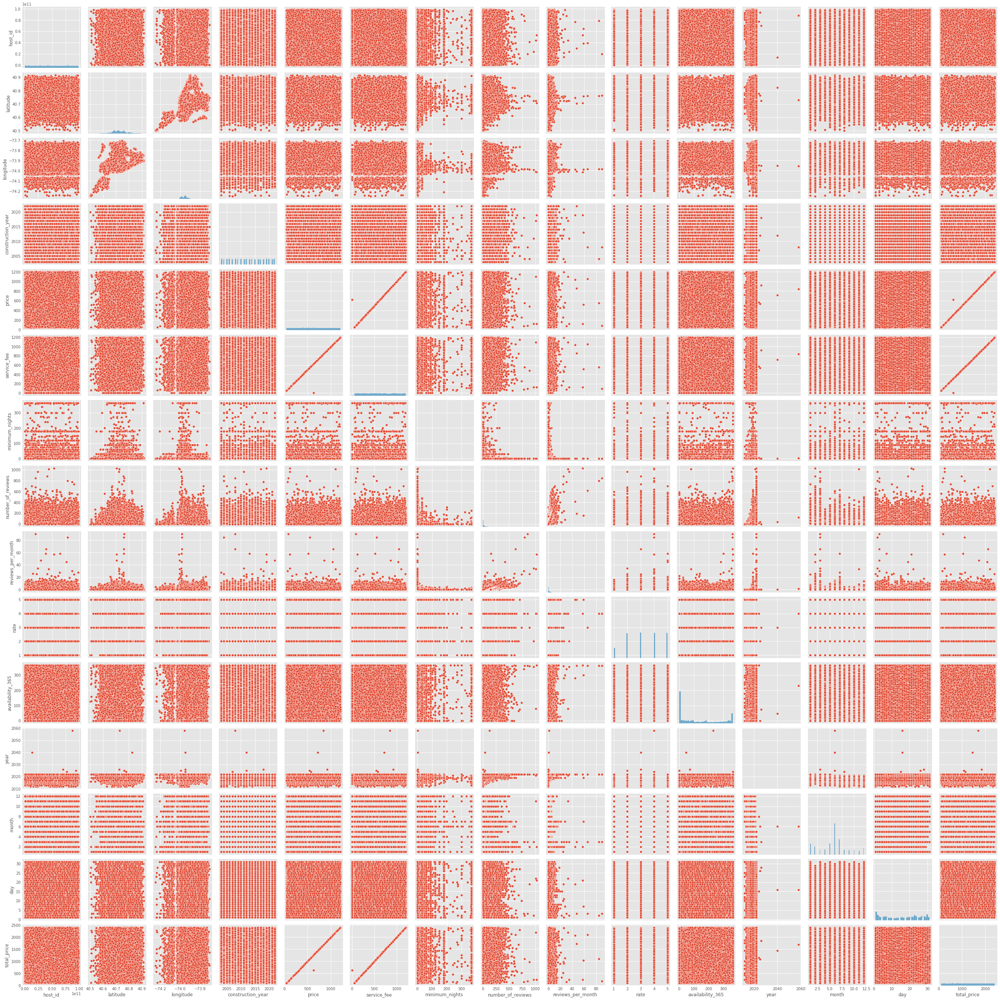

In [267]:
sns.pairplot(AirbnbData)

## Save final cleaned dataset

In [268]:
AirbnbData.to_csv("cleaned_AB_NYC.csv")

## Conclusion

When data scientists talk about “cleaning” data, it’s hard to interpret them literally. This is reasonable because data scientists do not physically clean data with sanitizer. Cleaning data involves making a dataset useful by removing and modifying erroneous or irrelevant values.

Data cleaning helps people who work in data science improve the accuracy of their conclusions. The goal of a data scientist is to find the answers to questions using data. If a data scientist is working with bad data, then their conclusion is less likely to be accurate.


Data cleaning is a fundamental part of the data analysis process. Cleaning happens after data is collected and before analysis. During the cleaning process, a data scientist will work to ensure that a dataset is valid, accurate, and includes all the values they need.

Without data cleaning, data scientists would have to go back-and-forth between analyzing a dataset and fixing issues with the underlying data. This is likely to confuse the data analysis process to the point where the final conclusion loses its accuracy.

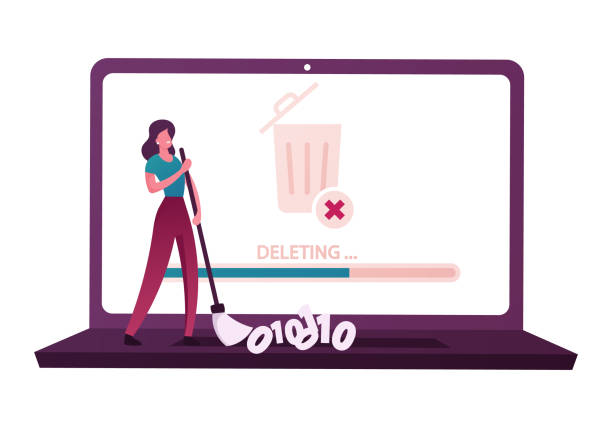

### Arian Azmoudeh

>Ai & Machine Learning Student

* Arian.Azmoudeh@yahoo.com
* https://www.linkedin.com/in/arianazmoudeh/

#### i hope you enjoy it